In [37]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [38]:
#python v3.11.3

import warnings
#to suppress seaborn palette warnings
warnings.filterwarnings("ignore", category=UserWarning)
#to suppress seaborn error estimation NaN warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)



import os
import datetime

import numpy as np #v1.25.0
import pandas as pd #v2.0.3
import scipy #v1.10.1
import scipy.stats as stats

import seaborn as sns #v0.13.0
import matplotlib as mpl #v3.8.1
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates

#import matplotlib.spines as spines
from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection

import importlib
# these files should be in the same directory as this Jupyter notebook
from loader import *
import analysis_functions
from analysis_functions import *
from plot_functions import *

# to set styles for plotting
mpl.style.use(r"C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\mouse_analysis\full_trial_analysis\mouse_analysis.mplstyle")

#to suppress inaccurate pandas reassignment warnings
pd.options.mode.chained_assignment = None  # default='warn'

# 1. Load Files

### Parameters

In [39]:
# directory files are pulled from
new = r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\Eunsol_data\new vs old acc\new acc'
old = r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\Eunsol_data\new vs old acc\old'

# file containing information about animals (cage, age, sex, strain) - must have Animal ID column
metadata_file = r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\Eunsol_data\new vs old metadata.xlsx'

mins = {
        "min_trials": 0,  # minimum number of trials in a bin to keep
        "min_blank": 0,   # minimum number of water trials
        "min_stimulus": 0 # minimum number of water trials 
        }

keys = {
    "millis bin":"puff delta",
    "Time (ms)":"Time (ms)",
    "stimulus type":"stimulus",
    "water delivery":"water",
    "trial no":"trial no",
    "time bin":"delta",
    "licks":"lick",
    "timestamp":"timestamp",
    "delay":"delay",
    "acc":"acc"
}

index = ["condition", "animal"]
keep = ["Age", "Sex", "Strain", "acc", "Cage", "before 2023"]
values = ["lick", "poke"]

metadata = pd.read_excel(metadata_file)

### 1.2 Load data

In [ ]:
#new
newdf = []
for d in os.listdir(new):
    print(f'starting {d}')
    cond = make_condition_df(new +'\\' + d, d, metadata, keep)
    newdf.append(cond)
newdf = pd.concat(newdf)
newdf['timing'] = 'new'

newkeep = keep + ["stimulus", "water", "type"]
time_bin = 4*60 # minutes
r = (700, 1000)
keys["millis bin"] = None
ant_data = bin_lickfreq(newdf, r, time_bin, keys, newkeep, values)

antkeep = newkeep + ["Time (hr)", "delta", "Day", "day_delta"]
mins["min_trials"] = 10 # minimum number of trials in a bin to keep
mins["min_blank"] = 1 # minimum number of water trials
mins["min_stimulus"] = 1 # minimum number of water trials
keys["time bin"] = "delta"
keys["millis bin"] = None

ant_data_filtered = drop_group(ant_data, mins, keys, "trial no", index, antkeep)
antfiltmeans, filtcounts, antfiltperf = agg(ant_data_filtered, keys, index, antkeep, values)
daytotsfilt = sum_trials(filtcounts, index + ["Day"], [],"trial no")
hourtotsfilt = sum_trials(filtcounts, index + ["Time (hr)"], [],"trial no")
for c in antfiltmeans["condition"].unique():
    click, cperf, ccount = antfiltmeans["condition"] == c, antfiltperf["condition"] == c, filtcounts["condition"] == c
    ant_tmp = antfiltmeans[click] 
    ant_tmp["Time (hr)"] = ant_tmp["Time (hr)"] + 2
    perf_tmp = antfiltperf[cperf]
    perf_tmp["Time (hr)"] = perf_tmp["Time (hr)"] + 2
    ct_tmp = filtcounts[ccount]
    ct_tmp["Time (hr)"] = ct_tmp["Time (hr)"] + 2
    for a in ant_tmp["animal"].unique():
        xmaj = ticker.MultipleLocator(12) 
        xmin = ticker.MultipleLocator(4) 
        g, axs = plt.subplots(3, 1, figsize=(10, 7))
        sns.lineplot(ant_tmp[ant_tmp["animal"] == a], x="Time (hr)", 
                            y="lick", hue="stimulus", palette=["red", "green"], 
                            hue_order=["blank", "stimulus"], errorbar=None, 
                            marker='o', mec=None, ms=10, ax=axs[0], legend=False)
        ymaj = ticker.LinearLocator(numticks=5)
        ymin = ticker.LinearLocator(numticks=13)
        style_axes_helper(axs[0], title=f"{c}: {a}", xlabel="Time (hr)", 
                            ylabel="Licking (Hz)", xlim=[-48, 4], 
                            ylim=[0, 12], xmajlocator=xmaj,xminlocator=xmin,
                            ymajlocator=ymaj, yminlocator=ymin)
        ymaj = ticker.LinearLocator(numticks=5)
        ymin = ticker.LinearLocator(numticks=13)
        sns.lineplot(ct_tmp[ct_tmp["animal"] == a], x="Time (hr)", 
                            y="trial no", color='k', errorbar=None, 
                            ax=axs[1])
        style_axes_helper(axs[1], title="", xlabel="Time (hr)", 
                            ylabel="Lick Frequency\n(Hz)", xlim=[-48, 4], 
                            ylim=[0, 300], xmajlocator=xmaj,xminlocator=xmin,
                            ymajlocator=ymaj, yminlocator=ymin)
        axs[1].fill_between(axs[1].lines[0].get_data()[0], axs[1].lines[0].get_data()[1], 
                        color='k', alpha=0.3)
        sns.lineplot(perf_tmp[perf_tmp["animal"] == a], x="Time (hr)", 
                            y="lick", color='k', errorbar=None, 
                            marker='o', mec=None, ms=10, ax=axs[2])
        ymaj = ticker.LinearLocator(numticks=5)
        ymin = ticker.LinearLocator(numticks=13)
        style_axes_helper(axs[2], title="", xlabel="Time (hr)", 
                            ylabel="Performance", xlim=[-48, 4], 
                            ylim=[-12, 12], xmajlocator=xmaj,xminlocator=xmin,
                            ymajlocator=ymaj, yminlocator=ymin)
        axs[2].axhline(y=0, xmin=0, xmax=1, ls="--", color="black", zorder=10, lw=0.5)

        
        g.subplots_adjust(hspace=0.45, wspace=0.25)
        plt.show()

In [ ]:
g = plot_ant_lickfreq(antfiltmeans[antfiltmeans['condition'] != 'SATnew'], 
                          legend=False, xlim=[-48, 4], ylim=[0, 10], errorbar='se', err_style='bars', err_kws={'lw':0.5})
g = plot_ant_perf(antfiltperf[antfiltperf['condition'] != 'SATnew'], xlim=[-48, 4], ylim=[-5, 5], errorbar='se', err_style='bars', err_kws={'lw':0.5})
g = plot_trial_hr(filtcounts[filtcounts['condition'] != 'SATnew'], xlim=[-48, 4], ylim=[0, 150],err_kws={'lw':0.5})

starting 100ACCold
starting SATold
animal
GSB8    2019-06-02 12:00:00
GXC7    2019-07-10 12:00:00
GXS4    2019-07-16 12:00:00
GXS5    2019-07-17 12:00:00
JND2    2020-12-19 12:00:00
JSS4    2021-02-27 12:00:00
NFZ13   2022-11-20 12:00:00
NFZ4    2022-11-20 12:00:00
NGX5    2022-12-02 12:00:00
NJO1    2022-12-14 12:00:00
NKZ10   2022-12-28 12:00:00
NKZ3    2022-12-27 12:00:00
NKZ4    2022-12-27 12:00:00
NKZ7    2022-12-27 12:00:00
NLB1    2022-12-29 12:00:00
NLB10   2022-12-28 12:00:00
NLB3    2022-12-29 12:00:00
NLB8    2022-12-28 12:00:00
NLG3    2022-12-26 12:00:00
NLN3    2022-12-31 12:00:00
NLN5    2022-12-31 12:00:00
NLV2    2022-12-29 12:00:00
NLV3    2022-12-29 12:00:00
NLV5    2022-12-31 12:00:00
Name: timestamp, dtype: datetime64[ns]
animal
GSB8    2019-06-02 12:00:00
GXC7    2019-07-10 12:00:00
GXS4    2019-07-16 12:00:00
GXS5    2019-07-17 12:00:00
JND2    2020-12-19 12:00:00
JSS4    2021-02-27 12:00:00
NFZ13   2022-11-20 12:00:00
NFZ4    2022-11-20 12:00:00
NGX5    2022-12-

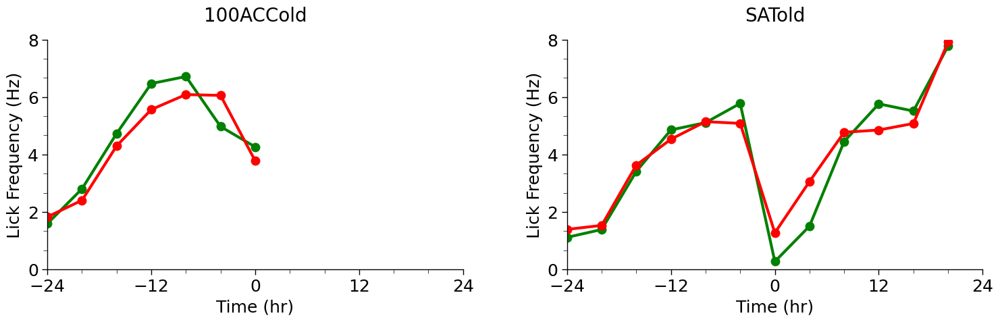

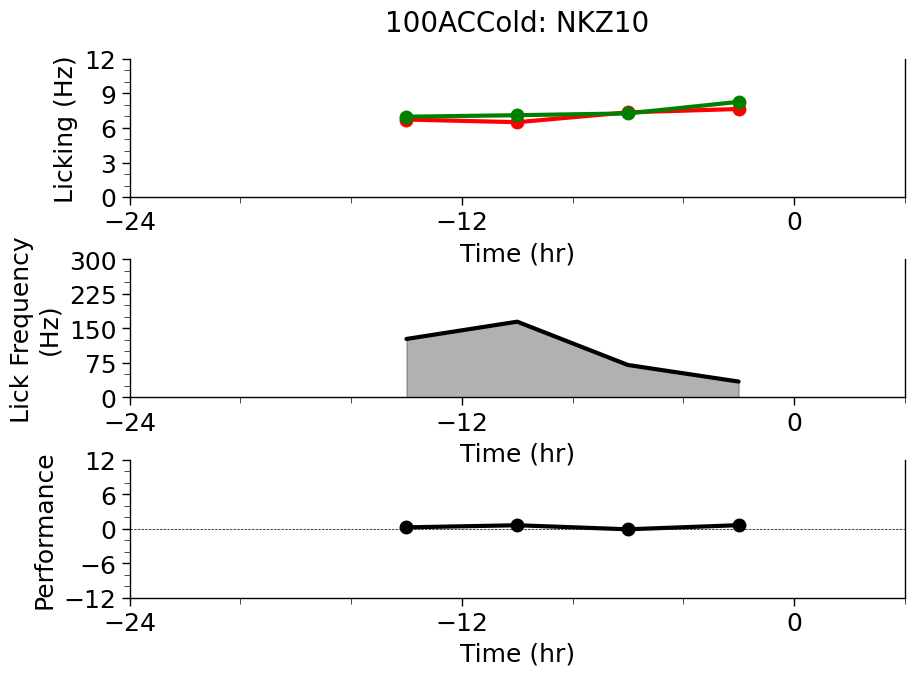

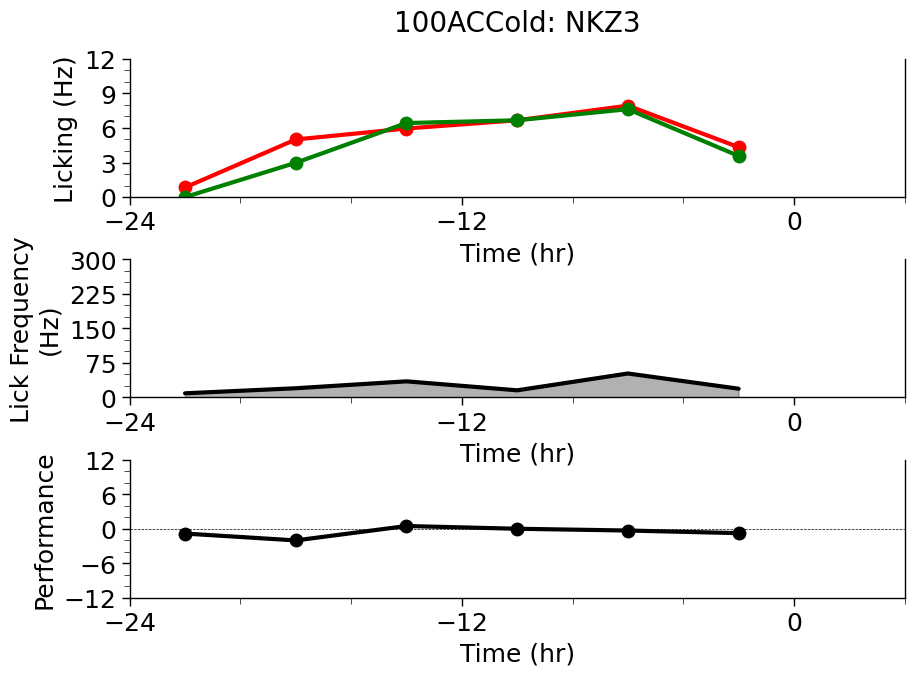

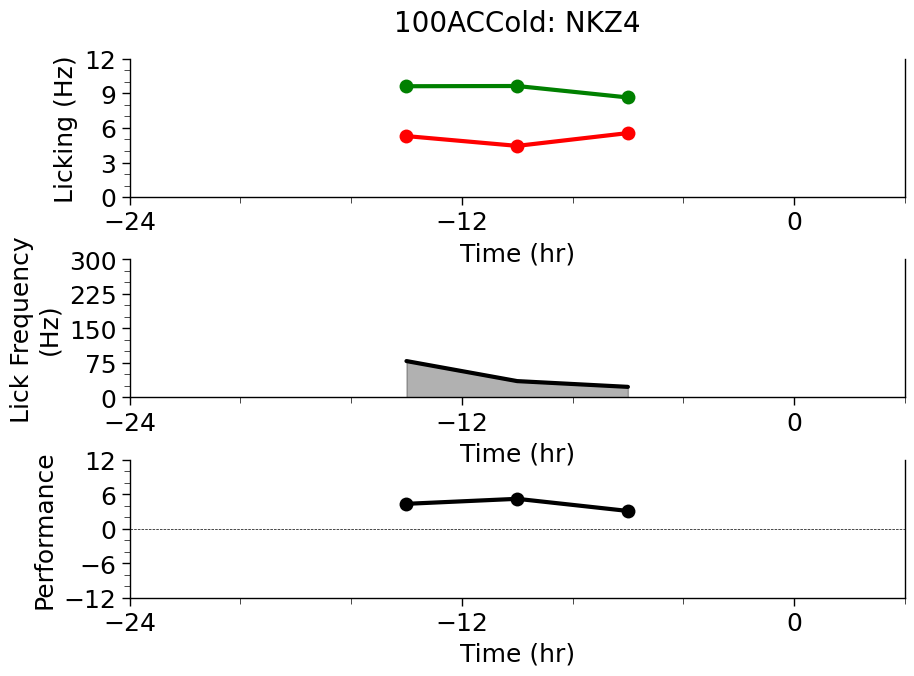

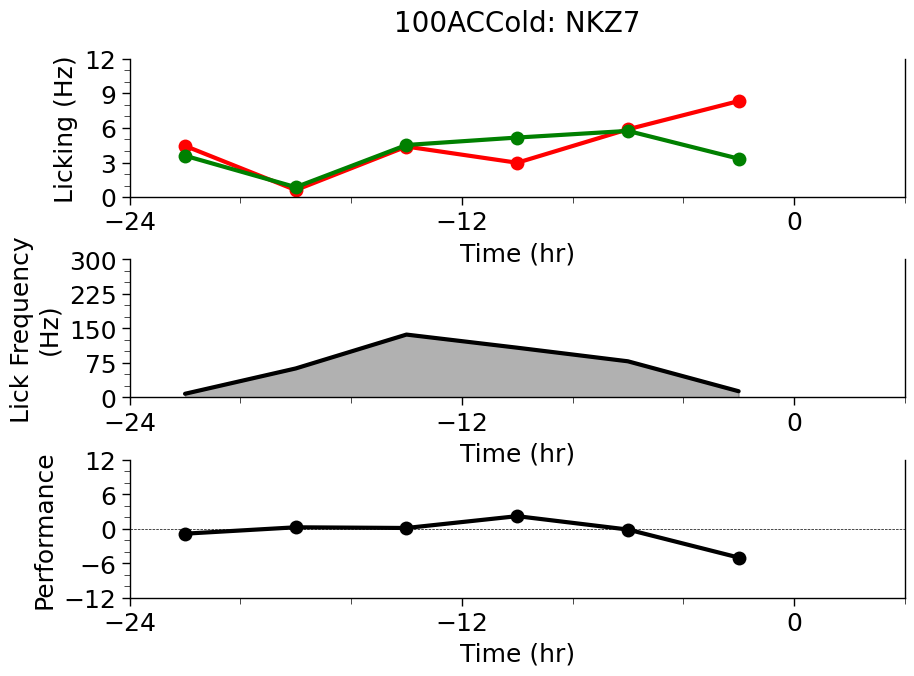

...

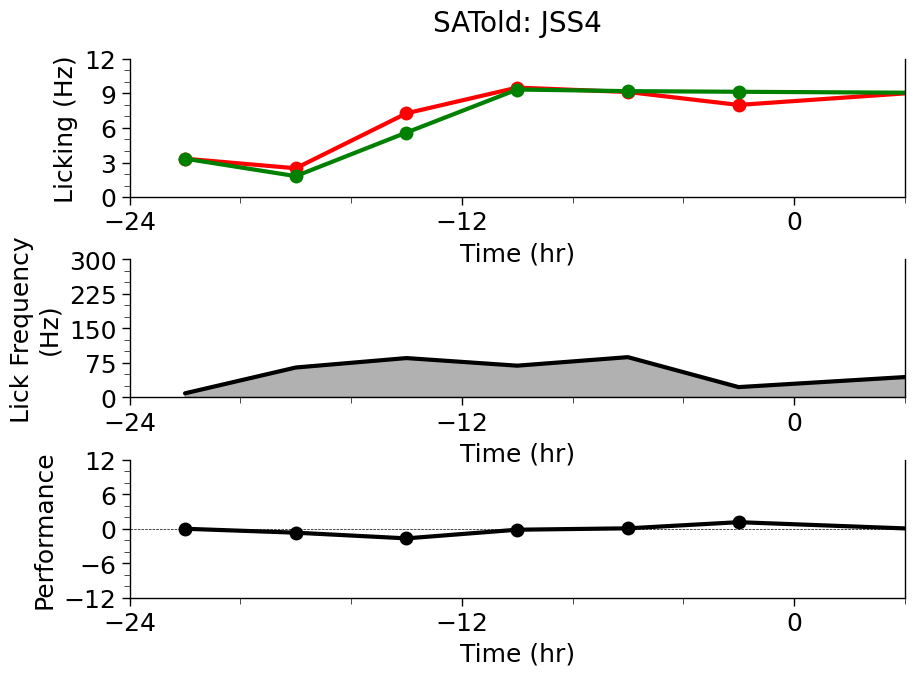

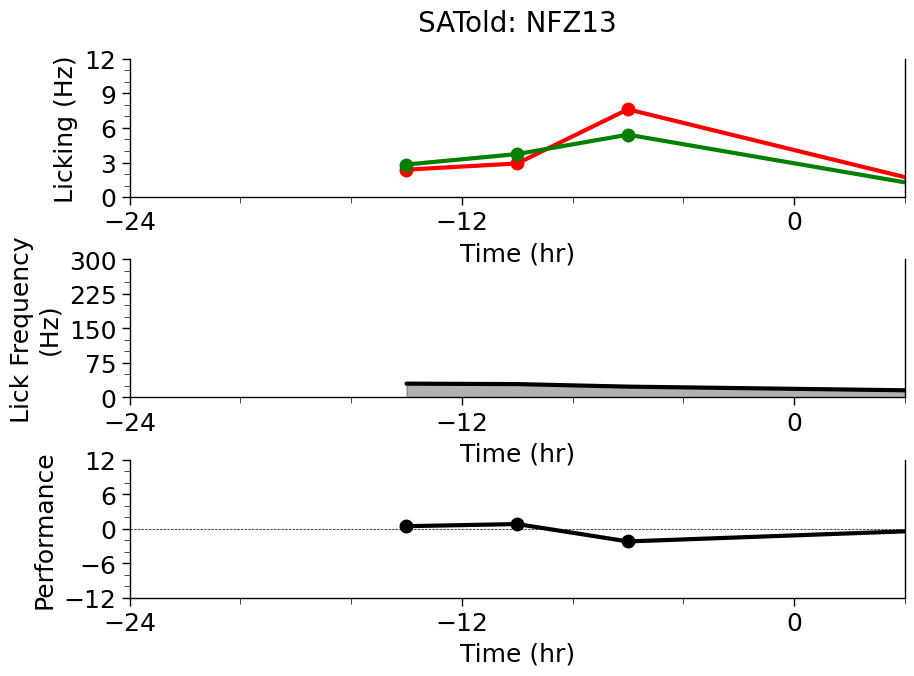

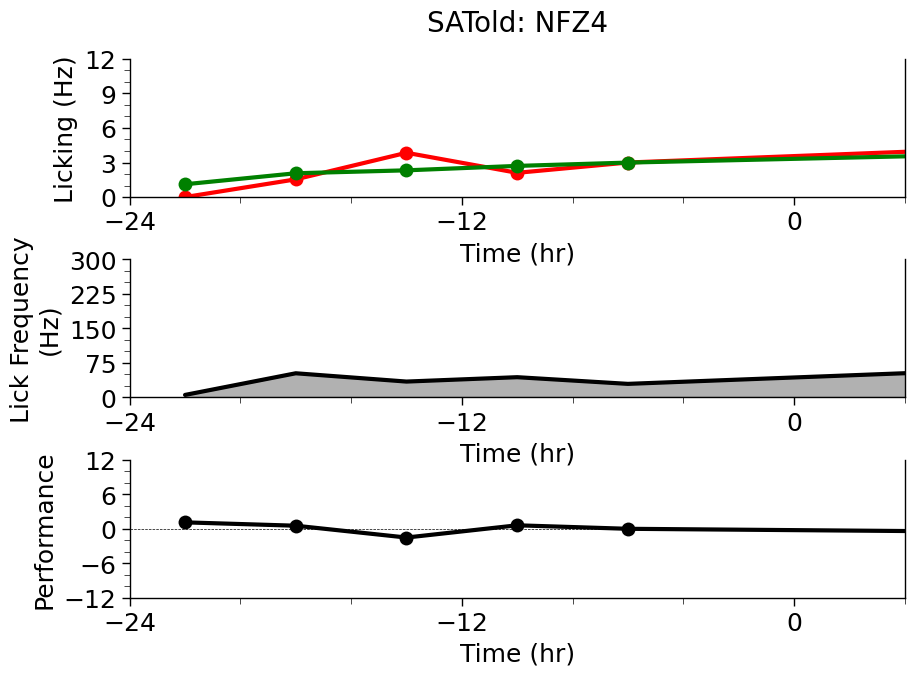

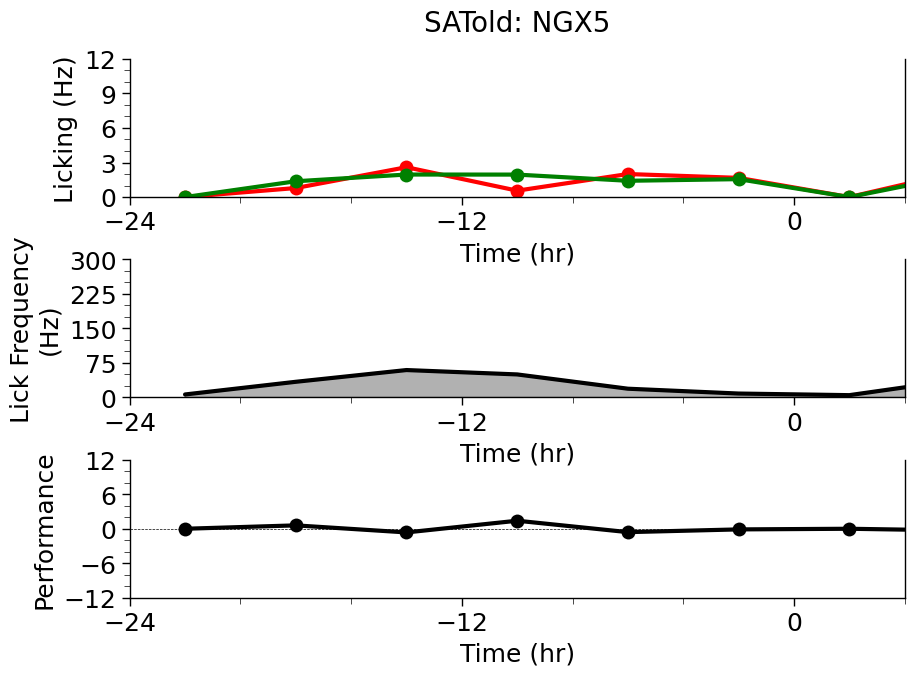

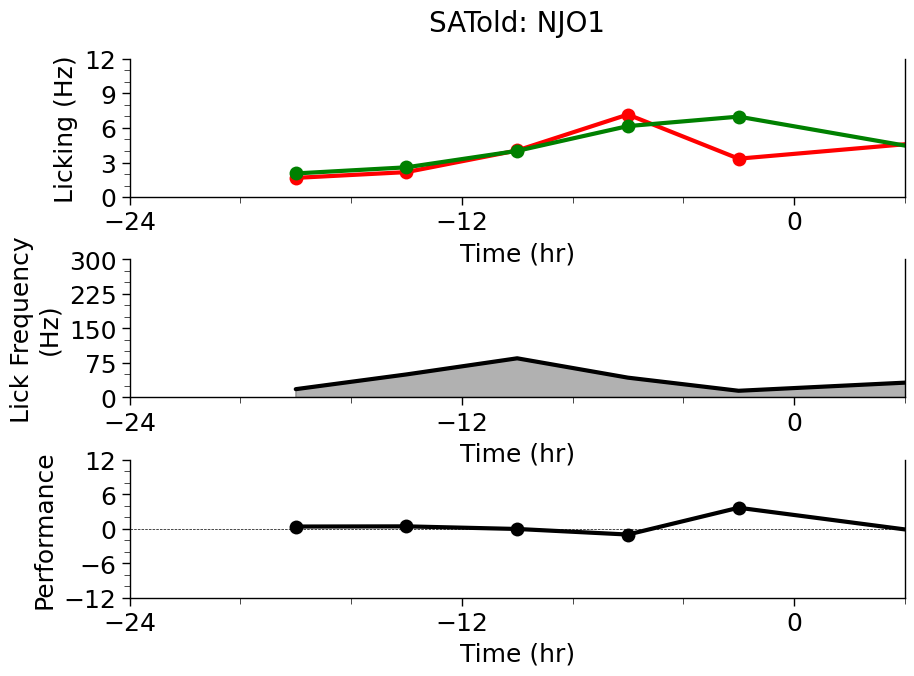

In [16]:
#old
olddf = []
for d in os.listdir(old):
    print(f'starting {d}')
    cond = make_condition_df(old +'\\' + d, d, metadata, keep)
    olddf.append(cond)
olddf = pd.concat(olddf)
olddf["timing"] = 'old'

oldkeep = keep + ["stimulus", "water", "type"]
time_bin = 4*60 # minutes
r = (700, 1000)
keys["millis bin"] = None
ant_data = bin_lickfreq(olddf, r, time_bin, keys, oldkeep, values)

antkeep = oldkeep + ["Time (hr)", "delta", "Day", "day_delta"]
mins["min_trials"] = 10 # minimum number of trials in a bin to keep
mins["min_blank"] = 1 # minimum number of water trials
mins["min_stimulus"] = 1 # minimum number of water trials
keys["time bin"] = "delta"
keys["millis bin"] = None

ant_data_filtered = drop_group(ant_data, mins, keys, "trial no", index, antkeep)
antfiltmeans, filtcounts, antfiltperf = agg(ant_data_filtered, keys, index, antkeep, values)
daytotsfilt = sum_trials(filtcounts, index + ["Day"], "trial no")
hourtotsfilt = sum_trials(filtcounts, index + ["Time (hr)"], "trial no")
g = plot_ant_lickfreq(antfiltmeans, 
                          legend=False, xlim=[-24, 24], ylim=[0, 8])
for c in antfiltmeans["condition"].unique():
   
    click, cperf, ccount = antfiltmeans["condition"] == c, antfiltperf["condition"] == c, filtcounts["condition"] == c
    ant_tmp = antfiltmeans[click] 
    ant_tmp["Time (hr)"] = ant_tmp["Time (hr)"] + 2
    perf_tmp = antfiltperf[cperf]
    perf_tmp["Time (hr)"] = perf_tmp["Time (hr)"] + 2
    ct_tmp = filtcounts[ccount]
    ct_tmp["Time (hr)"] = ct_tmp["Time (hr)"] + 2
    for a in ant_tmp["animal"].unique():
        xmaj = ticker.MultipleLocator(12) 
        xmin = ticker.MultipleLocator(4) 
        g, axs = plt.subplots(3, 1, figsize=(10, 7))
        sns.lineplot(ant_tmp[ant_tmp["animal"] == a], x="Time (hr)", 
                            y="lick", hue="stimulus", palette=["red", "green"], 
                            hue_order=["blank", "stimulus"], errorbar=None, 
                            marker='o', mec=None, ms=10, ax=axs[0], legend=False)
        ymaj = ticker.LinearLocator(numticks=5)
        ymin = ticker.LinearLocator(numticks=13)
        style_axes_helper(axs[0], title=f"{c}: {a}", xlabel="Time (hr)", 
                            ylabel="Licking (Hz)", xlim=[-24, 4], 
                            ylim=[0, 12], xmajlocator=xmaj,xminlocator=xmin,
                            ymajlocator=ymaj, yminlocator=ymin)
        ymaj = ticker.LinearLocator(numticks=5)
        ymin = ticker.LinearLocator(numticks=13)
        sns.lineplot(ct_tmp[ct_tmp["animal"] == a], x="Time (hr)", 
                            y="trial no", color='k', errorbar=None, 
                            ax=axs[1])
        style_axes_helper(axs[1], title="", xlabel="Time (hr)", 
                            ylabel="Lick Frequency\n(Hz)", xlim=[-24, 4], 
                            ylim=[0, 300], xmajlocator=xmaj,xminlocator=xmin,
                            ymajlocator=ymaj, yminlocator=ymin)
        axs[1].fill_between(axs[1].lines[0].get_data()[0], axs[1].lines[0].get_data()[1], 
                        color='k', alpha=0.3)
        sns.lineplot(perf_tmp[perf_tmp["animal"] == a], x="Time (hr)", 
                            y="lick", color='k', errorbar=None, 
                            marker='o', mec=None, ms=10, ax=axs[2])
        ymaj = ticker.LinearLocator(numticks=5)
        ymin = ticker.LinearLocator(numticks=13)
        style_axes_helper(axs[2], title="", xlabel="Time (hr)", 
                            ylabel="Performance", xlim=[-24, 4], 
                            ylim=[-12, 12], xmajlocator=xmaj,xminlocator=xmin,
                            ymajlocator=ymaj, yminlocator=ymin)
        axs[2].axhline(y=0, xmin=0, xmax=1, ls="--", color="black", zorder=10, lw=0.5)

        
        g.subplots_adjust(hspace=0.45, wspace=0.25)
        plt.show()

In [65]:
metadata = pd.read_excel(metadata_file)

#new
newdf = []
for d in os.listdir(new):
    print(f'starting {d}')
    cond = make_condition_df(new +'\\' + d, d, metadata, keep)
    newdf.append(cond)
newdf = pd.concat(newdf)
newdf['timing'] = 'new'

#old
olddf = []
for d in os.listdir(old):
    print(f'starting {d}')
    cond = make_condition_df(old +'\\' + d, d, metadata, keep)
    olddf.append(cond)
olddf = pd.concat(olddf)
olddf["timing"] = 'old'

df = pd.concat([newdf, olddf])

keep = keep + ["stimulus", "water", "type", "timing"]

starting 100ACCnew
PLC2 stimulus not in metadata file
PLC2 water not in metadata file
PLC2 type not in metadata file
PLC2 timing not in metadata file
PLX11 stimulus not in metadata file
PLX11 water not in metadata file
PLX11 type not in metadata file
PLX11 timing not in metadata file
PLX14 stimulus not in metadata file
PLX14 water not in metadata file
PLX14 type not in metadata file
PLX14 timing not in metadata file
starting 70ACCnew
PLC7 stimulus not in metadata file
PLC7 water not in metadata file
PLC7 type not in metadata file
PLC7 timing not in metadata file
PLW2 stimulus not in metadata file
PLW2 water not in metadata file
PLW2 type not in metadata file
PLW2 timing not in metadata file
starting ACCnew
PLC4 stimulus not in metadata file
PLC4 water not in metadata file
PLC4 type not in metadata file
PLC4 timing not in metadata file
PLC6 stimulus not in metadata file
PLC6 water not in metadata file
PLC6 type not in metadata file
PLC6 timing not in metadata file
PLC9 stimulus not in m

['Stormi']


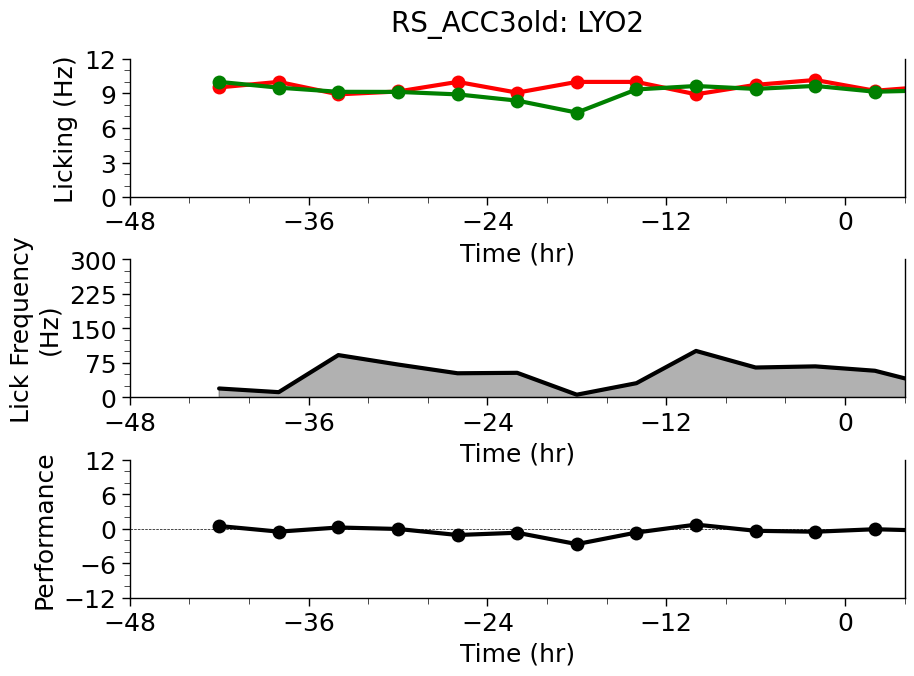

['Kourtney']


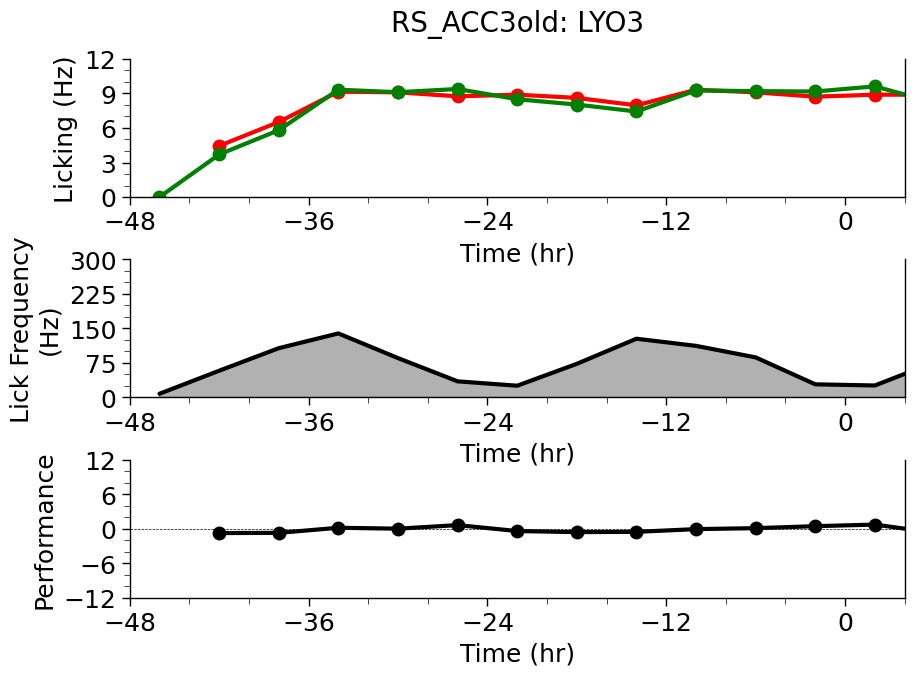

['Rob2']


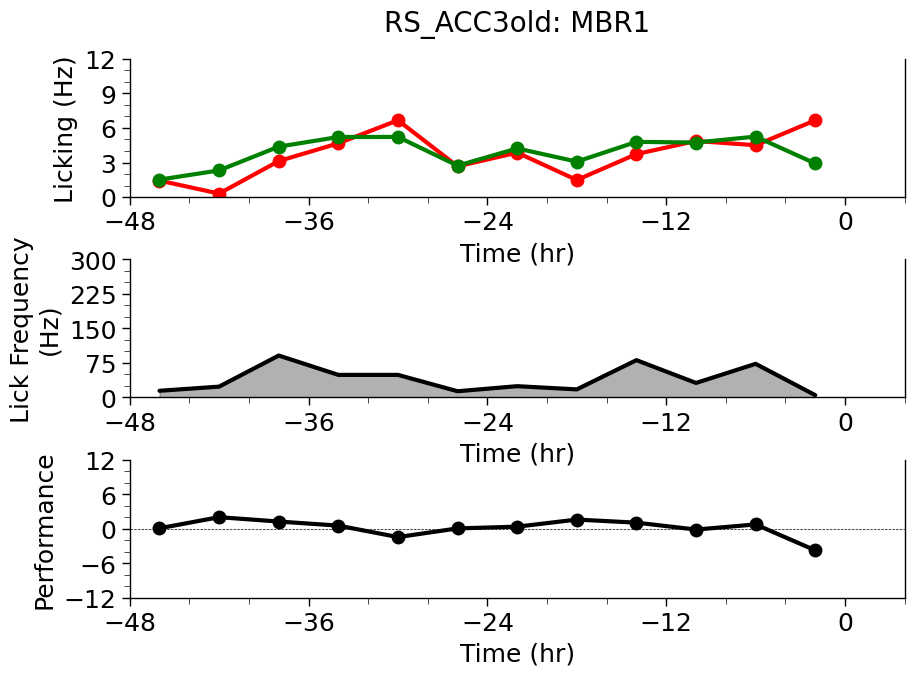

['Caitlyn']


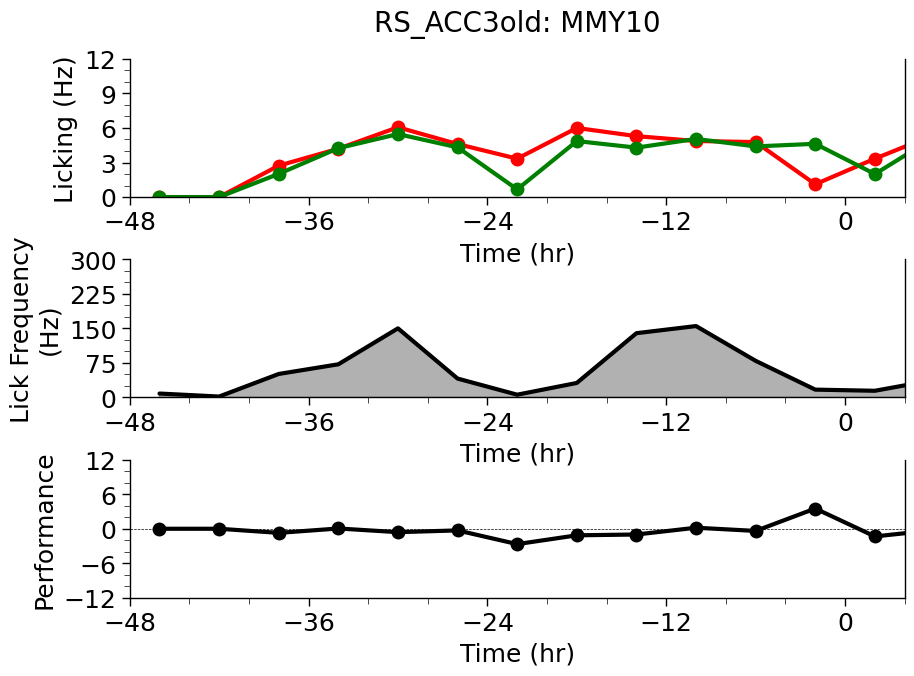

['Mason']


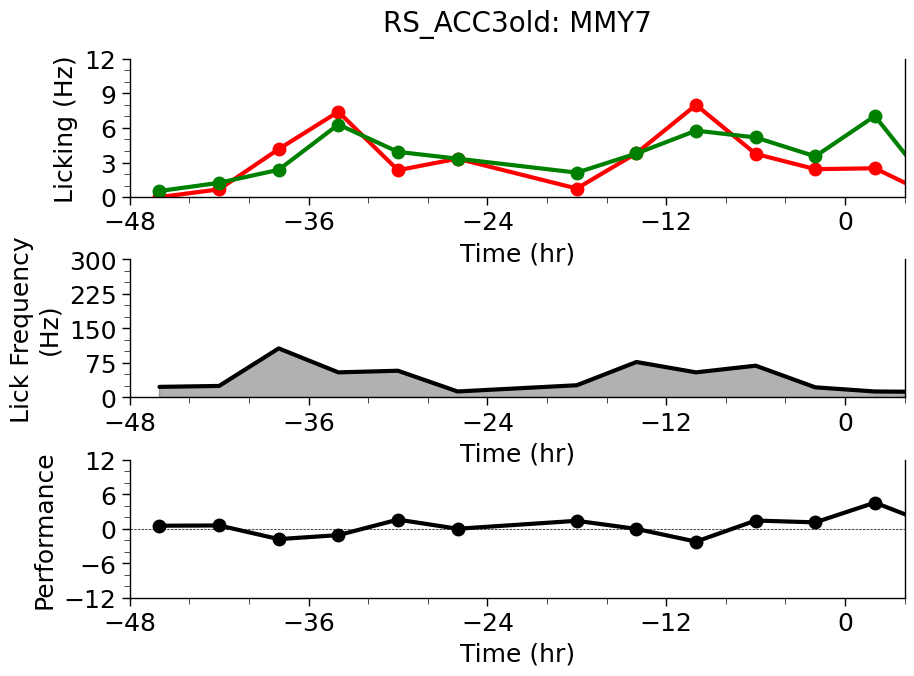

[None]


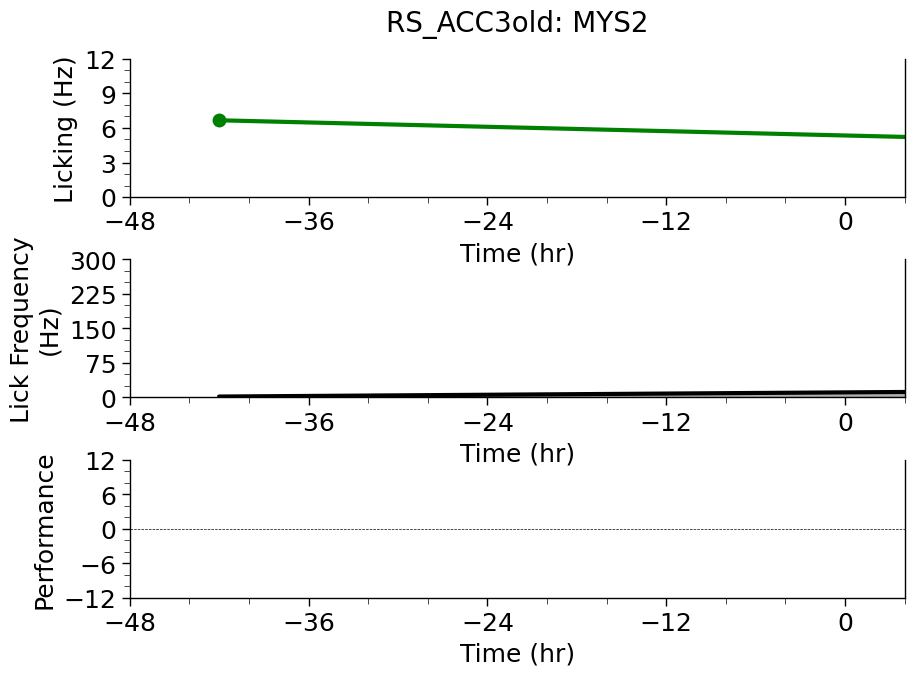

['Stormi']


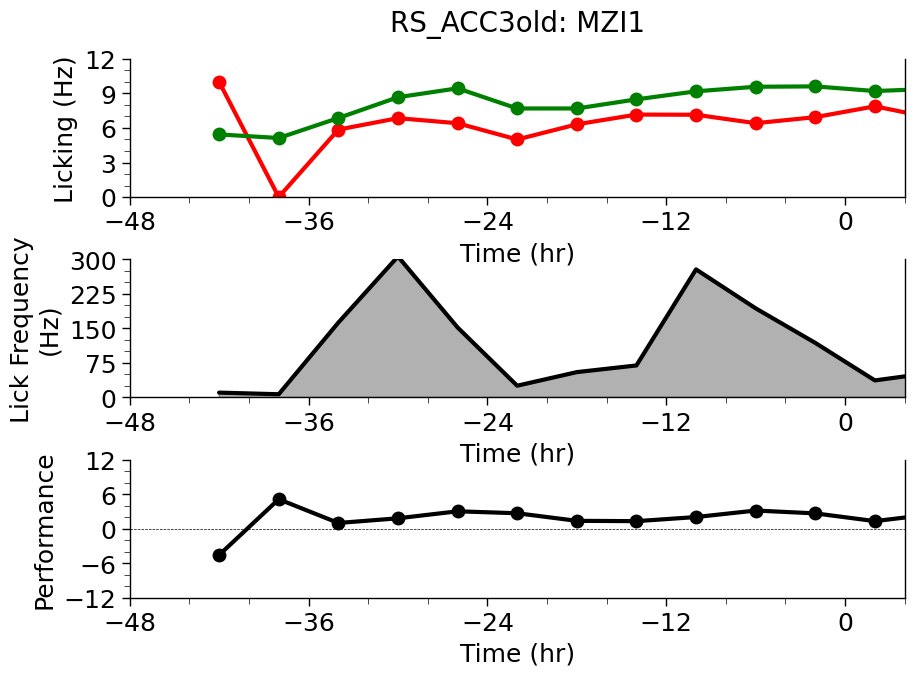

[None]


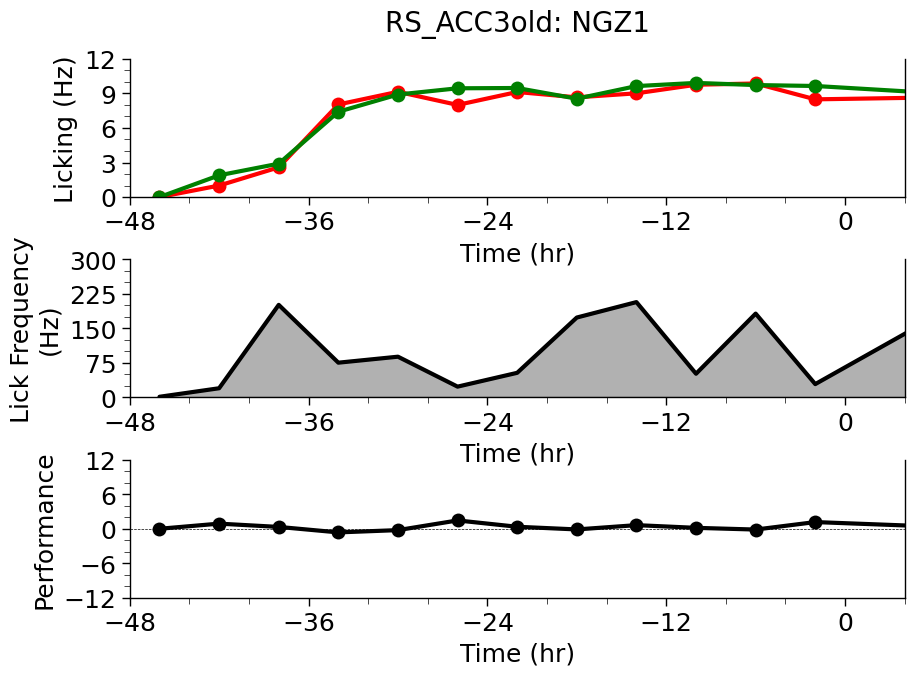

In [103]:
for c in ant_means["condition"].unique():
    if 'RS' in c:
        click, cperf, ccount = ant_means["condition"] == c, ant_perf["condition"] == c, counts["condition"] == c
        ant_tmp = ant_means[click] 
        ant_tmp["Time (hr)"] = ant_tmp["Time (hr)"] + 2
        perf_tmp = ant_perf[cperf]
        perf_tmp["Time (hr)"] = perf_tmp["Time (hr)"] + 2
        ct_tmp = counts[ccount]
        ct_tmp["Time (hr)"] = ct_tmp["Time (hr)"] + 2
        for a in ant_tmp["animal"].unique():
            print(ant_tmp[ant_tmp["animal"] == a]['Cage'].unique())
            xmaj = ticker.MultipleLocator(12) 
            xmin = ticker.MultipleLocator(4) 
            g, axs = plt.subplots(3, 1, figsize=(10, 7))
            sns.lineplot(ant_tmp[ant_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", hue="stimulus", palette=["red", "green"], 
                                hue_order=["blank", "stimulus"], errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[0], legend=False)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[0], title=f"{c}: {a}", xlabel="Time (hr)", 
                                ylabel="Licking (Hz)", xlim=[-48, 4], 
                                ylim=[0, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            sns.lineplot(ct_tmp[ct_tmp["animal"] == a], x="Time (hr)", 
                                y="trial no", color='k', errorbar=None, 
                                ax=axs[1])
            style_axes_helper(axs[1], title="", xlabel="Time (hr)", 
                                ylabel="Lick Frequency\n(Hz)", xlim=[-48, 4], 
                                ylim=[0, 300], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            axs[1].fill_between(axs[1].lines[0].get_data()[0], axs[1].lines[0].get_data()[1], 
                            color='k', alpha=0.3)
            sns.lineplot(perf_tmp[perf_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", color='k', errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[2])
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[2], title="", xlabel="Time (hr)", 
                                ylabel="Performance", xlim=[-48, 4], 
                                ylim=[-12, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            axs[2].axhline(y=0, xmin=0, xmax=1, ls="--", color="black", zorder=10, lw=0.5)

            
            g.subplots_adjust(hspace=0.45, wspace=0.25)
            plt.show()

# 2. Lick Frequency Analysis

All plotting is done using a combination of the
`seaborn` and `matplotlib` modules.

## 2.1 Anticipatory licking



### 2.1.1 Analysis, 4h bins

Here grouped by 4 hour bins. The range `r` is inclusive on both sides, here (700, 1000).

In [91]:
time_bin = 4*60 # minutes
r = (700, 1000)
keys["millis bin"] = None
ant_data = bin_lickfreq(df, r, time_bin, keys, keep, values)

antkeep = keep + ["Time (hr)", "delta", "Day", "day_delta"]

animal
GSB8                    2019-06-02 12:00:00
GXS4                    2019-07-16 12:00:00
GXS5                    2019-07-17 12:00:00
JND2                    2020-12-19 12:00:00
JSS4                    2021-02-27 12:00:00
LYO2                    2022-03-04 12:00:00
LYO3                    2022-03-04 12:00:00
MBR1                    2022-04-04 12:00:00
MMY10                   2022-06-20 12:00:00
MMY7                    2022-06-20 12:00:00
MYS2                    2022-09-27 12:00:00
MZI1                    2022-10-04 12:00:00
NFZ13                   2022-11-20 12:00:00
NFZ4                    2022-11-20 12:00:00
NGX5                    2022-12-02 12:00:00
NGZ1                    2022-11-30 12:00:00
NJO1                    2022-12-14 12:00:00
NKZ10                   2022-12-28 12:00:00
NKZ3                    2022-12-27 12:00:00
NKZ4                    2022-12-27 12:00:00
NKZ7                    2022-12-27 12:00:00
NLB1                    2022-12-29 12:00:00
NLB10                   2

In [92]:
#ant_data = ant_data[ant_data["Time (hr)"] <= 0]
ant_data = ant_data[((ant_data["condition"].str.contains('SAT')) & (ant_data["Time (hr)"] <= -24)) | ((~(ant_data["condition"].str.contains('SAT'))) & (ant_data["Time (hr)"] <= 0)) | (ant_data["condition"].str.contains('RS'))]
ant_data = ant_data[ant_data["Time (hr)"] >= -48]
ant_data["Day"] = ant_data["Day"].replace({"ACC -1":"ACC 1", "ACC 0":"ACC 2"})
ant_data["year"] = ant_data["timestamp"].dt.year
antkeep = antkeep + ["year"]

In [94]:
antkeep.remove('timestamp')

In [93]:
keys["time bin"] = "delta"
keys["millis bin"] = None
antkeep = antkeep + ['timestamp']
ant_means, counts, ant_perf = agg(ant_data, keys, index, antkeep, values)
daytots = sum_trials(counts, index + ['Day', 'stimulus'],  ["timing", "year", "timestamp", 'Sex', 'Cage'], "trial no")
hourtots = sum_trials(counts, index + ["Time (hr)"], ["timing","year", "timestamp", 'Sex', 'Cage'], "trial no")

In [54]:
total = counts.groupby(["condition", "animal", "stimulus", "Day"])["trial no"].sum().reset_index().set_index(["condition", "animal", "Day", "stimulus"]).unstack(level="stimulus")
frac = total.loc[:, ("trial no", "stimulus")] / (total.loc[:, ("trial no", "stimulus")] + (total.loc[:, ("trial no", "blank")]))
frac = frac.reset_index()
frac[frac["condition"].str.contains('new')].to_clipboard()

In [55]:
counts['Sex'] = counts['Sex'].replace({None:'U'})
counts[counts['animal'].str.contains('O')]

,condition,animal,delta,stimulus,water,trial no,Age,Sex,Strain,acc,Cage,before 2023,type,timing,Time (hr),Day,day_delta,year
375,SATnew,OEP2,-2 days +00:00:00,blank,no water,4,NaN,U,U,2 days,U,yes,no water & blank,new,-48.0,ACC 1,-2 days,2023
376,SATnew,OEP2,-2 days +00:00:00,stimulus,water,23,NaN,U,U,2 days,U,yes,water & stimulus,new,-48.0,ACC 1,-2 days,2023
377,SATnew,OEP2,-2 days +04:00:00,blank,no water,11,NaN,U,U,2 days,U,yes,no water & blank,new,-44.0,ACC 1,-2 days,2023
378,SATnew,OEP2,-2 days +04:00:00,stimulus,water,65,NaN,U,U,2 days,U,yes,water & stimulus,new,-44.0,ACC 1,-2 days,2023
379,SATnew,OEP2,-2 days +08:00:00,blank,no water,35,NaN,U,U,2 days,U,yes,no water & blank,new,-40.0,ACC 1,-2 days,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,SATold,NJO1,-2 days +16:00:00,stimulus,water,66,25.0,M,Sscre x Ai32,2 days,Mason,no,water & stimulus,old,-32.0,ACC 1,-2 days,2022
550,SATold,NJO1,-2 days +20:00:00,blank,no water,8,25.0,M,Sscre x Ai32,2 days,Mason,no,no water & blank,old,-28.0,ACC 1,-2 days,2022
551,SATold,NJO1,-2 days +20:00:00,stimulus,water,21,25.0,M,Sscre x Ai32,2 days,Mason,no,water & stimulus,old,-28.0,ACC 1,-2 days,2022
552,SATold,NJO1,-1 days +00:00:00,blank,no water,2,25.0,M,Sscre x Ai32,2 days,Mason,no,no water & blank,old,-24.0,ACC 2,-1 days,2022


In [117]:
mins["min_trials"] = 10 # minimum number of trials in a bin to keep
mins["min_blank"] = 1 # minimum number of water trials
mins["min_stimulus"] = 1 # minimum number of water trials
keys["time bin"] = "delta"
keys["millis bin"] = None
ant_data_filtered = drop_group(ant_data, mins, keys, "trial no", index, antkeep)
antfiltmeans, filtcounts, antfiltperf = agg(ant_data_filtered, keys, index, antkeep, values)
daytotsfilt = sum_trials(filtcounts, index + ['Day'],  ["timing", "year"], "trial no")
hourtotsfilt = sum_trials(filtcounts, index + ["Time (hr)"], ["timing","year"], "trial no")

In [299]:
parts = 5 # number of partitions to divide each day's trials into 
nth_part = 4 # which partition of trials to get (0-indexed)
nth_part_data = get_nth_part_day(ant_data, parts, nth_part)

keys["time bin"] = "Day"
nthpart_lickfreq, nthpart_counts, nthpart_perf = agg(nth_part_data, keys, index, antkeep, values)

In [304]:
nthpart_perf[nthpart_perf['condition'].str.contains('ACCnew')][["condition", "animal", "lick", "Day"]].set_index(['condition', 'animal', 'Day']).unstack(level='Day').to_clipboard()

#### Trial counts

Number of animals with data per timebin

In [42]:
num_per_timebin = counts.groupby(["condition", "animal", "timing", "Time (hr)"]).first().reset_index().groupby(["timing","condition","Time (hr)"])["animal"].count().reset_index()
num_per_timebin.set_index(["timing", "condition", "Time (hr)"]).unstack("Time (hr)").to_clipboard()

In [11]:
num_per_timebin_filt = filtcounts.groupby(["condition", "animal", "Time (hr)"]).first().reset_index().groupby(["condition","Time (hr)"])["animal"].count().reset_index()
num_per_timebin_filt.set_index(["condition", "Time (hr)"]).unstack("Time (hr)").to_clipboard()

Total number of animals per condition

In [12]:
num_per_timebin.groupby("condition")["animal"].max().to_clipboard()

In [13]:
num_per_timebin_filt.groupby("condition")["animal"].max().to_clipboard()

Average number of trials in a timebin by condition

In [99]:
hourtots.groupby(["timing","condition","Time (hr)"])["trial no"].mean().unstack(level="Time (hr)").to_clipboard()

In [48]:
hourtotsfilt.groupby(["timing", "condition","Time (hr)"])["trial no"].mean().unstack(level="Time (hr)").to_clipboard()

Number of trials in a timebin by animal at t=0-4 hours

In [16]:
at0 = counts[counts["Time (hr)"] == 0][["condition","animal", "stimulus","trial no"]].set_index(["condition", "animal","stimulus"]).unstack(level="stimulus").fillna(0)
at0.loc[:, ("trial no", "sum")] = at0.loc[:, ("trial no", "blank")] + at0.loc[:, ("trial no", "stimulus")]
at0.stack(level="stimulus").unstack(level=["condition", "animal"]).to_clipboard()

In [17]:
at0filt = filtcounts[filtcounts["Time (hr)"] == -4][["condition","animal", "stimulus","trial no"]].set_index(["condition", "animal","stimulus"]).unstack(level="stimulus").fillna(0)
at0filt.loc[:, ("trial no", "sum")] = at0filt.loc[:, ("trial no", "blank")] + at0filt.loc[:, ("trial no", "stimulus")]
at0filt.stack(level="stimulus").unstack(level=["condition", "animal"])

trial no                                                \
condition 100% ACC, 80% SAT                                                 
animal                NKZ10 NKZ3 NKZ7 NLB1 NLB10 NLB3 NLG3 NLN3 NLN5 NLV3   
stimulus                                                                    
blank                    17   10    6   11     3    8    2   13   12    1   
stimulus                 52   28   21   39    17   39   22   25   48   33   
sum                      69   38   27   50    20   47   24   38   60   34   

           ...                                                               \
condition  ... mCherry + CNO                  mCherry + DCZ                   
animal     ...          NCY6 NDR1 NIO15 NIO16          OKN2 OWY6 PIE8 PIT14   
stimulus   ...                                                                
blank      ...             6   10     4     4             4    4    6     4   
stimulus   ...            39   25    12    13            24   22   31    23   
sum        ...            45   35    16    17            28   26   37    27   

                       
condition              
animal    PIT15 PIT17  
stimulus               
blank        22     2  
stimulus     74    16  
sum          96    18  

[3 rows x 54 columns]

Number of trials in all timebins by animal and condition

In [100]:
counts[["condition","animal", "Time (hr)", "stimulus","trial no"]].sort_values("Time (hr)").set_index(["condition", "animal","Time (hr)", "stimulus"]).unstack(level=["Time (hr)", "stimulus"]).to_clipboard()

In [19]:
filtcounts[["condition","animal", "Time (hr)", "stimulus","trial no"]].sort_values("Time (hr)").set_index(["condition", "animal","Time (hr)", "stimulus"]).unstack(level=["Time (hr)", "stimulus"]).to_clipboard()

In [20]:
hourtots[["condition","animal", "Time (hr)","trial no"]].set_index(["condition", "animal","Time (hr)"]).unstack(level=["Time (hr)"]).to_clipboard()

In [21]:
hourtotsfilt[["condition","animal", "Time (hr)","trial no"]].set_index(["condition", "animal","Time (hr)"]).unstack(level=["Time (hr)"]).to_clipboard()

### 2.1.2 Plotting, unfiltered

Lick frequency, performance, and trial no plots for all animals

In [ ]:

for c in ant_means["condition"].unique():
    if "DCZ" in c:
        click, cperf, ccount = ant_means["condition"] == c, ant_perf["condition"] == c, counts["condition"] == c
        ant_tmp = ant_means[click] 
        ant_tmp["Time (hr)"] = ant_tmp["Time (hr)"] + 2
        perf_tmp = ant_perf[cperf]
        perf_tmp["Time (hr)"] = perf_tmp["Time (hr)"] + 2
        ct_tmp = counts[ccount]
        ct_tmp["Time (hr)"] = ct_tmp["Time (hr)"] + 2
        for a in ant_tmp["animal"].unique():
            xmaj = ticker.MultipleLocator(12) 
            xmin = ticker.MultipleLocator(4) 
            g, axs = plt.subplots(3, 1, figsize=(10, 7))
            sns.lineplot(ant_tmp[ant_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", hue="stimulus", palette=["red", "green"], 
                                hue_order=["blank", "stimulus"], errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[0], legend=False)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[0], title=f"{c}: {a}", xlabel="Time (hr)", 
                                ylabel="Licking (Hz)", xlim=[-48, 48], 
                                ylim=[0, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            sns.lineplot(ct_tmp[ct_tmp["animal"] == a], x="Time (hr)", 
                                y="trial no", color='k', errorbar=None, 
                                ax=axs[1])
            style_axes_helper(axs[1], title="", xlabel="Time (hr)", 
                                ylabel="Lick Frequency\n(Hz)", xlim=[-48, 48], 
                                ylim=[0, 300], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            axs[1].fill_between(axs[1].lines[0].get_data()[0], axs[1].lines[0].get_data()[1], 
                            color='k', alpha=0.3)
            sns.lineplot(perf_tmp[perf_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", color='k', errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[2])
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[2], title="", xlabel="Time (hr)", 
                                ylabel="Performance", xlim=[-48, 48], 
                                ylim=[-12, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            
            
            g.subplots_adjust(hspace=0.45, wspace=0.25)
            plt.show()

Number of trials by day

In [56]:
daytots["cd"] = daytots["condition"].replace({"100ACCnew":"100ACC", "100ACCold":"100ACC", "SATold":"ACC", "SATnew":"ACC", "ACCnew":"ACC", 'RS_ACC3old':"ACC"})
daytots['sy'] = daytots['year'].astype(str) + daytots['Sex']

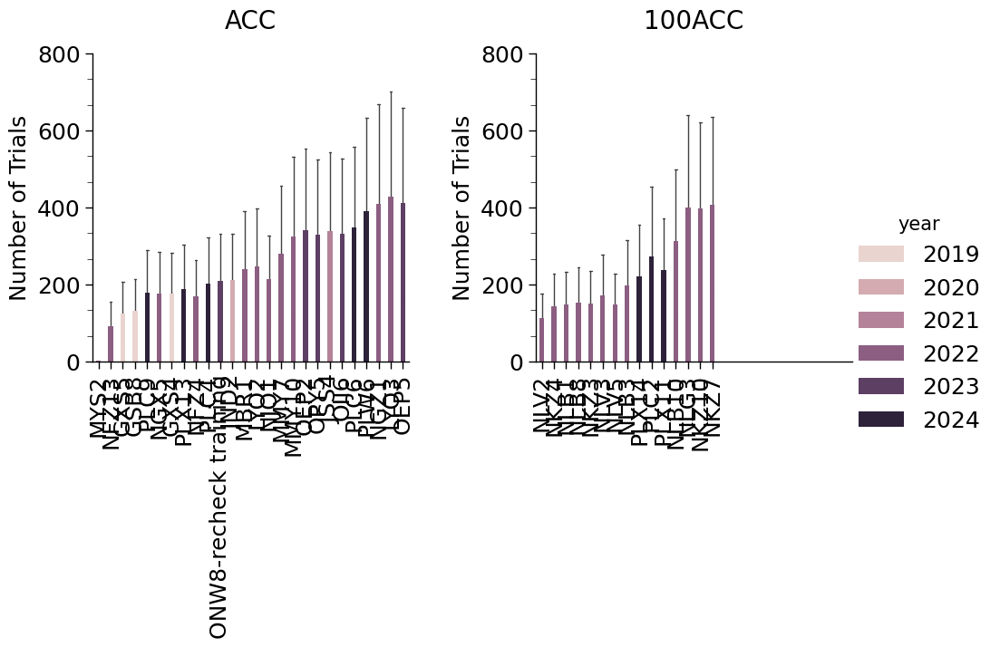

In [58]:
tmp = daytots[(daytots["Day"] == "ACC 1") & ~(daytots["animal"].str.contains('NLN'))]
tmp = tmp.sort_values(["cd", "sy"])
ho = tmp['sy'].sort_values().unique()
tmp = tmp[(tmp["Day"] == "ACC 1")].sort_values("trial no")
g = plot_trial_bar(tmp[(tmp["Day"] == "ACC 1")], xlim=[-0.5, 25.5], ylim=[0, 800],wspace=0.4,x='animal',hue="year",
                   col='cd',color=None,col_order=['ACC', '100ACC'],dodge=False, legend=True)
for name, ax in g.axes_dict.items():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center")

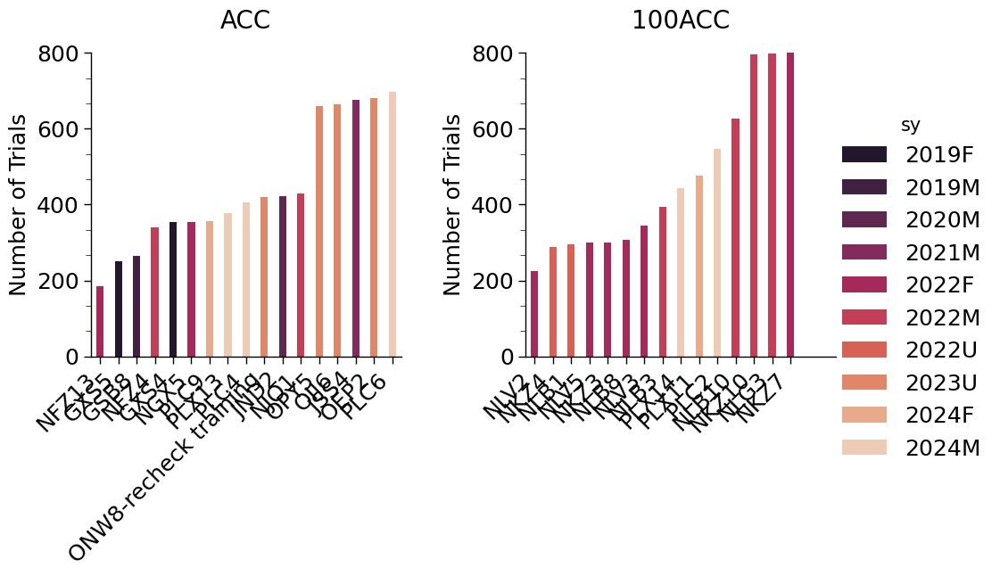

In [220]:
tmp = daytots[(daytots["Day"] == "ACC 1") & ~(daytots["animal"].str.contains('NLN'))]
tmp = tmp.sort_values(["cd", "sy"])
ho = tmp['sy'].sort_values().unique()
tmp = tmp[(tmp["Day"] == "ACC 1")].sort_values("trial no")

g = plot_trial_bar(tmp[(tmp["Day"] == "ACC 1")], xlim=[-0.5, 16.5], ylim=[0, 800],wspace=0.4,x='animal',hue="sy",palette='rocket',hue_order=ho,
                   col='cd',color=None,col_order=['ACC', '100ACC'],dodge=False, legend=True)
for name, ax in g.axes_dict.items():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

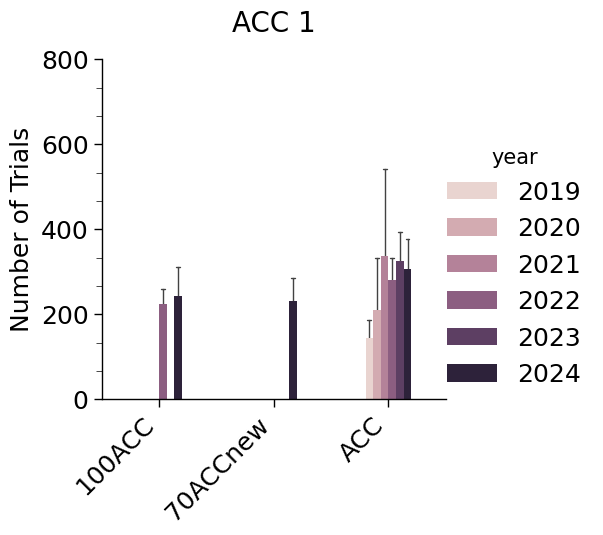

In [59]:
g = plot_trial_bar(daytots[daytots["Day"] == "ACC 1"], xlim=[-0.5, 2.5], ylim=[0, 800],wspace=0.4,hue="year",x='cd',color=None, dodge=True, legend=True)
for name, ax in g.axes_dict.items():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

### 2.1.3 Statistical Tests, unfiltered

Total number of trials between groups by day (should not be significantly different)

t-test if two conditions, ANOVA otherwise

In [169]:
daytots["cdy"] = daytots["cd"] + ", " + daytots["year"].astype(str)
daytots["cdy"].unique()

array(['100ACC, 2024', '100ACC, 2022', '100ACC, 2023', 'ACC, 2024',
       'ACC, 2023', 'ACC, 2019', 'ACC, 2020', 'ACC, 2021', 'ACC, 2022'],
      dtype=object)

In [182]:
res = []
cond = (daytots["cd"].str.contains("DCZ"))
tmp = daytots[(daytots["Day"] == "ACC 1") & (daytots["year"] != 2020) & (daytots['year'] !=2021)]
tt_separated = []
for c in tmp["cdy"].unique():
    print(c)
    #for y in tmp["year"].unique():
    #    print(y)
    if not tmp[(tmp["cdy"] == c)].empty:
        tt_separated.append(tmp[(tmp["cdy"] == c)]["trial no"])

res.append(stats.f_oneway(*tt_separated))
res1 = stats.tukey_hsd(*tt_separated) 
res

100ACC, 2024
100ACC, 2022
100ACC, 2023
ACC, 2024
ACC, 2023
ACC, 2019
ACC, 2022


[F_onewayResult(statistic=2.297700366312914, pvalue=0.0627228941503652)]

In [183]:
print(res1)

Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)     87.714     0.989  -287.992   463.421
 (0 - 2)    262.000     0.607  -220.173   744.173
 (0 - 3)     87.333     0.997  -394.840   569.507
 (0 - 4)   -160.400     0.896  -591.669   270.869
 (0 - 5)    199.333     0.841  -282.840   681.507
 (0 - 6)    161.750     0.911  -289.282   612.782
 (1 - 0)    -87.714     0.989  -463.421   287.992
 (1 - 2)    174.286     0.759  -201.421   549.992
 (1 - 3)     -0.381     1.000  -376.087   375.325
 (1 - 4)   -248.114     0.178  -555.778    59.550
 (1 - 5)    111.619     0.962  -264.087   487.325
 (1 - 6)     74.036     0.991  -260.769   408.840
 (2 - 0)   -262.000     0.607  -744.173   220.173
 (2 - 1)   -174.286     0.759  -549.992   201.421
 (2 - 3)   -174.667     0.907  -656.840   307.507
 (2 - 4)   -422.400     0.058  -853.669     8.869
 (2 - 5)    -62.667     1.000  -544.840   419.507
 (2 - 6)   -100.250     0.991  -

Total number of trials between groups by hour

t-test if two conditions, ANOVA otherwise

In [130]:
res = []
cond = (total_by_hour["condition"].str.contains("CNO"))
tmp = total_by_hour[cond]
tmp = tmp.sort_values("Time (hr)")
for t in tmp["Time (hr)"].unique(): 
    tt_separated = []
    for c in tmp["condition"].unique():
        tt_separated.append(tmp[(tmp["Time (hr)"] == t) & (tmp["condition"] == c)]["trial no"])
    if len(tmp["condition"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(tmp["condition"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))
pd.DataFrame(res, columns=["statistic", "pvalue"], index=tmp["Time (hr)"].unique()).to_clipboard()

Number of animals with data per timebin

In [34]:
num_per_timebin = counts.groupby(["condition", "animal", "Time (hr)"]).first().reset_index().groupby(["condition","Time (hr)"])["animal"].count().reset_index()
num_per_timebin.set_index(["condition", "Time (hr)"]).unstack("Time (hr)").to_clipboard()

Total number of animals per condition

In [38]:
num_per_timebin.groupby("condition")["animal"].max().to_clipboard()

Average number of trials in a timebin by condition

In [39]:
total_by_hour.groupby(["condition","Time (hr)"])["trial no"].mean().unstack(level="Time (hr)").to_clipboard()

Number of trials in a timebin by animal at t=0-4 hours

In [40]:
at0 = counts[counts["Time (hr)"] == 0][["condition","animal", "stimulus","trial no"]].set_index(["condition", "animal","stimulus"]).unstack(level="stimulus").fillna(0)
at0.loc[:, ("trial no", "sum")] = at0.loc[:, ("trial no", "blank")] + at0.loc[:, ("trial no", "stimulus")]
at0.to_clipboard()#.stack(level="stimulus").unstack(level=["condition", "animal"]).to_clipboard()

Number of trials in all timebins by animal and condition

In [41]:
counts[["condition","animal", "Time (hr)", "stimulus","trial no"]].sort_values("Time (hr)").set_index(["condition", "animal","Time (hr)", "stimulus"]).unstack(level=["Time (hr)", "stimulus"]).to_clipboard()

In [42]:
total_by_hour[["condition","animal", "Time (hr)","trial no"]].set_index(["condition", "animal","Time (hr)"]).unstack(level=["Time (hr)"]).to_clipboard()

Last 20% aggegrate

In [12]:
last20_lickfreq, last20_counts, last20_perf = agg(nth_part_data, min_trials, min_blank_trials, min_water_trials, ["day_delta", "type"])

### 2.1.2 Plotting, filtered

In [ ]:
for c in antfiltmeans["condition"].unique():
    if c =='mCherry + CNO':
        click, cperf, ccount = antfiltmeans["condition"] == c, antfiltperf["condition"] == c, filtcounts["condition"] == c
        ant_tmp = antfiltmeans[click] 
        ant_tmp["Time (hr)"] = ant_tmp["Time (hr)"] + 2
        perf_tmp = antfiltperf[cperf]
        perf_tmp["Time (hr)"] = perf_tmp["Time (hr)"] + 2
        ct_tmp = filtcounts[ccount]
        ct_tmp["Time (hr)"] = ct_tmp["Time (hr)"] + 2
        for a in ant_tmp["animal"].unique():
            xmaj = ticker.MultipleLocator(12) 
            xmin = ticker.MultipleLocator(4) 
            g, axs = plt.subplots(3, 1, figsize=(10, 7))
            sns.lineplot(ant_tmp[ant_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", hue="stimulus", palette=["red", "green"], 
                                hue_order=["blank", "stimulus"], errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[0], legend=False)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[0], title=f"{c}: {a}", xlabel="Time (hr)", 
                                ylabel="Licking (Hz)", xlim=[-48, 48], 
                                ylim=[0, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            sns.lineplot(ct_tmp[ct_tmp["animal"] == a], x="Time (hr)", 
                                y="trial no", color='k', errorbar=None, 
                                ax=axs[1])
            style_axes_helper(axs[1], title="", xlabel="Time (hr)", 
                                ylabel="Lick Frequency\n(Hz)", xlim=[-48, 48], 
                                ylim=[0, 300], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            axs[1].fill_between(axs[1].lines[0].get_data()[0], axs[1].lines[0].get_data()[1], 
                            color='k', alpha=0.3)
            sns.lineplot(perf_tmp[perf_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", color='k', errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[2])
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[2], title="", xlabel="Time (hr)", 
                                ylabel="Performance", xlim=[-48, 48], 
                                ylim=[-12, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            axs[2].axhline(y=0, xmin=0, xmax=1, ls="--", color="black", zorder=10, lw=0.5)

            
            g.subplots_adjust(hspace=0.45, wspace=0.25)
            plt.show()

Lick frequency for stimulus and blank trials

In [ ]:
for c in antfiltmeans["condition"].unique():
    g = plot_ant_lickfreq(antfiltmeans[antfiltmeans["condition"] == c], 
                          legend=False, xlim=[-24, 24], ylim=[0, 8]) 
    g = plot_ant_perf(antfiltperf[antfiltperf["condition"] == c], ylabel="Performance", 
                      xlim=[-24, 24], legend=False, ylim=[-4, 4], title='')
    g = plot_trial_hr(hourtotsfilt[hourtotsfilt["condition"] == c], xlim=[-24, 24], ylim=[0, 200], aspect=3, title='')
    #g.figure.suptitle(c, y=1.05, x=0.5, fontsize=25)


Performance (L<sub>stim</sub> - L<sub>blank</sub>) as a line plot and a bar plot

In [ ]:
sat = "#5E72FF"
dcz_hm4di = "#E1CD9B"
dcz_mcherry = "#B78787"
all_reward = "#B787B7"
cond = (antfiltperf["condition"].str.contains("CNO"))
ordr=["Control", "100% ACC, 80% SAT", "mCherry + CNO", "hM4Di + CNO","mCherry + DCZ", "hM4Di + DCZ"]
p=[sat, all_reward, "maroon","goldenrod", dcz_mcherry, dcz_hm4di]

g = plot_ant_perf(antfiltperf[cond], ylabel="Performance", xlim=[-48, 48], hue="condition", palette=p, hue_order=ordr,col=None,legend=True)
g.fig.axes[0].axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=0, lw=1)

# using a palette to color different conditions

#p = [sat, all_reward, "goldenrod", "maroon", dcz_hm4di, dcz_mcherry]
#ordr=["Control", "100% ACC, 80% SAT", "hM4Di + CNO", "mCherry + CNO", "hM4Di + DCZ", "mCherry + DCZ"]
cond = (antfiltperf["condition"] == "Control") | (antfiltperf["condition"] == "hM4Di + DCZ") | (antfiltperf["condition"] == "mCherry + DCZ")

ylim=[-5, 5]
plot_ant_perf_bar(antfiltperf[cond], ylim=ylim, hue="condition", palette=p, hue_order=ordr,col_order=ordr,legend=False, xlim=[-26, 26], col_wrap=None)

Number of trials by day and by time bin

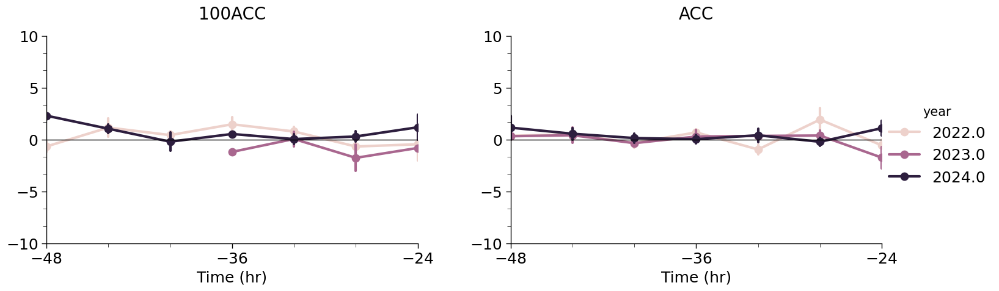

In [205]:
ant_perf["cd"] = ant_perf["condition"].replace({"100ACCnew":"100ACC", "100ACCold":"100ACC", "SATold":"ACC", "SATnew":"ACC", "ACCnew":"ACC"})
plot_ant_perf(ant_perf[ant_perf['year'] >= 2022], xlim=[-48, -24], col='cd', hue='year',errorbar='se', err_style='bars')

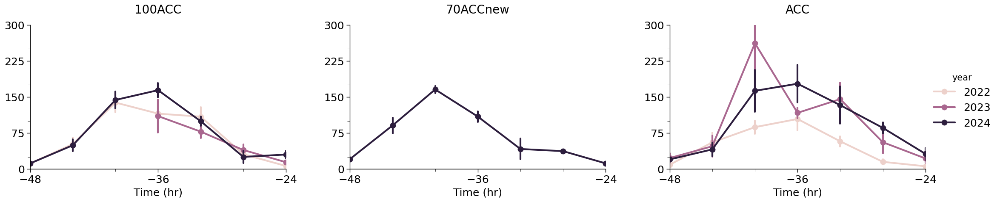

In [235]:

hourtots["cd"] = hourtots["condition"].replace({"100ACCnew":"100ACC", "100ACCold":"100ACC", "SATold":"ACC", "SATnew":"ACC", "ACCnew":"ACC"})
plot_ant_perf(hourtots[hourtots['year'] >= 2022], xlim=[-48, -24], y="trial no", ylim=[0, 300],col='cd', hue='year',errorbar='se', err_style='bars')

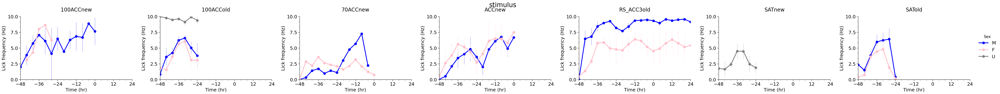

In [111]:
hourtots["cd"] = hourtots["condition"].replace({"100ACCnew":"100ACC", "100ACCold":"100ACC", "SATold":"ACC", "SATnew":"ACC", "ACCnew":"ACC"})
colors=['purple', 'lavender', 'orange', 'darkblue', 'blue','lightblue', 'blue']
plot_ant_perf(ant_means[(ant_means['stimulus'] == 'stimulus')], 
              xlim=[-48, 24], y="lick", ylim=[0, 10],col='condition', hue='Sex',palette=['blue', 'pink', 'grey'],errorbar='se', err_style='bars',
              ylabel='Lick frequency (Hz)',err_kws={'lw':0.5}, suptitle='stimulus')

In [273]:
ant_means['litter'] = ant_means['animal'].str.replace('[0-9]', '', regex=True)
ant_means

,condition,animal,delta,stimulus,lick,poke,Age,Sex,Strain,acc,...,before 2023,type,timing,Time (hr),Day,day_delta,year,timestamp,water,litter
0,100ACCnew,PLC2,-2 days +00:00:00,stimulus,1.666667,6.111111,29.0,M,Sscre x Ai32,2 days,...,yes,water & stimulus,new,-48.0,ACC 1,-2 days,2024,2024-01-08 14:02:06.460000000,water,PLC
1,100ACCnew,PLC2,-2 days +04:00:00,blank,1.212121,2.424242,29.0,M,Sscre x Ai32,2 days,...,yes,no water & blank,new,-44.0,ACC 1,-2 days,2024,2024-01-08 18:15:52.220000000,no water,PLC
2,100ACCnew,PLC2,-2 days +04:00:00,stimulus,2.328042,3.809524,29.0,M,Sscre x Ai32,2 days,...,yes,water & stimulus,new,-44.0,ACC 1,-2 days,2024,2024-01-08 17:18:05.560000000,water,PLC
3,100ACCnew,PLC2,-2 days +08:00:00,blank,3.611111,4.861111,29.0,M,Sscre x Ai32,2 days,...,yes,no water & blank,new,-40.0,ACC 1,-2 days,2024,2024-01-08 20:01:41.609999872,no water,PLC
4,100ACCnew,PLC2,-2 days +08:00:00,stimulus,4.522145,5.337995,29.0,M,Sscre x Ai32,2 days,...,yes,water & stimulus,new,-40.0,ACC 1,-2 days,2024,2024-01-08 20:00:03.440000000,water,PLC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,SATold,NJO1,-2 days +16:00:00,stimulus,6.161616,7.929293,25.0,M,Sscre x Ai32,2 days,...,no,water & stimulus,old,-32.0,ACC 1,-2 days,2022,2022-12-15 05:49:54.180000000,water,NJO
600,SATold,NJO1,-2 days +20:00:00,blank,3.333333,5.000000,25.0,M,Sscre x Ai32,2 days,...,no,no water & blank,old,-28.0,ACC 1,-2 days,2022,2022-12-15 08:26:41.960000000,no water,NJO
601,SATold,NJO1,-2 days +20:00:00,stimulus,6.984127,9.206349,25.0,M,Sscre x Ai32,2 days,...,no,water & stimulus,old,-28.0,ACC 1,-2 days,2022,2022-12-15 08:26:52.049999872,water,NJO
602,SATold,NJO1,-1 days +00:00:00,blank,3.333333,3.333333,25.0,M,Sscre x Ai32,2 days,...,no,no water & blank,old,-24.0,ACC 2,-1 days,2022,2022-12-15 12:10:00.569999872,no water,NJO


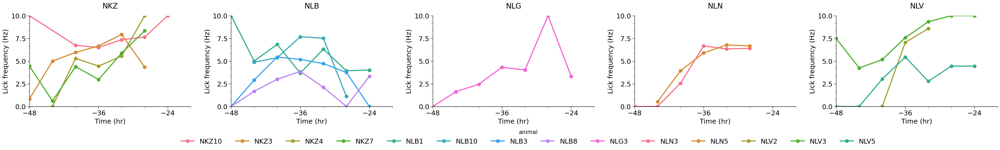

In [282]:
hourtots["cd"] = hourtots["condition"].replace({"100ACCnew":"100ACC", "100ACCold":"100ACC", "SATold":"ACC", "SATnew":"ACC", "ACCnew":"ACC"})
p=sns.color_palette('husl', 9)
g = plot_ant_perf(ant_means[(ant_means['stimulus'] == 'blank') & (ant_means['condition'].str.contains('ACCold'))], 
              xlim=[-48, -20], y="lick", ylim=[0, 10],col='litter', hue='animal',palette=p,errorbar='se', err_style='bars',
              ylabel='Lick frequency (Hz)')
sns.move_legend(g,'lower center', ncol=15, bbox_to_anchor=(0.5,-0.15))

Last 20% of trials 

   condition animal    Day  stimulus      lick      poke   Age Sex  \
0  100ACCnew   PLC2  ACC 1     blank  7.936508  8.253968  29.0   M   
1  100ACCnew   PLC2  ACC 1  stimulus  8.033708  8.239700  29.0   M   
6  100ACCnew  PLX11  ACC 1     blank  7.984496  8.372093  27.0   F   
7  100ACCnew  PLX11  ACC 1  stimulus  8.277405  8.814318  27.0   F   
8  100ACCnew  PLX14  ACC 1     blank  4.343434  8.787879  29.0   M   
9  100ACCnew  PLX14  ACC 1  stimulus  5.045662  9.589041  29.0   M   

         Strain    acc    Cage before 2023              type timing  \
0  Sscre x Ai32 2 days  Gengar         yes  no water & blank    new   
1  Sscre x Ai32 2 days  Gengar         yes  water & stimulus    new   
6  Sscre x Ai32 2 days  Travis         yes  no water & blank    new   
7  Sscre x Ai32 2 days  Travis         yes  water & stimulus    new   
8  Sscre x Ai32 2 days  Travis         yes  no water & blank    new   
9  Sscre x Ai32 2 days  Travis         yes  water & stimulus    new   

   Time (hr

array(['100ACCnew', '100ACCold', '70ACCnew', 'ACCnew', 'SATnew', 'SATold'],
      dtype=object)

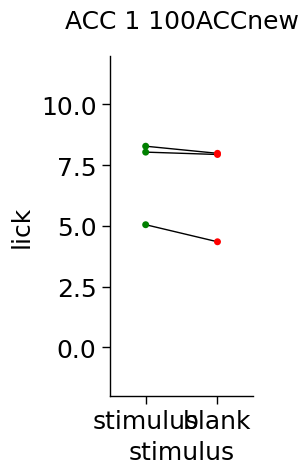

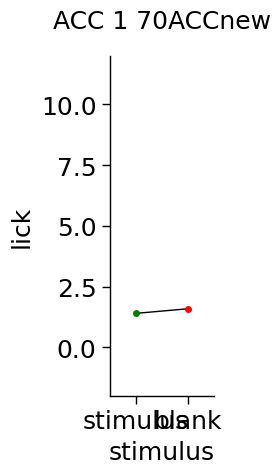

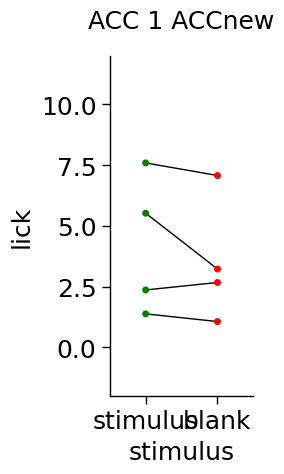

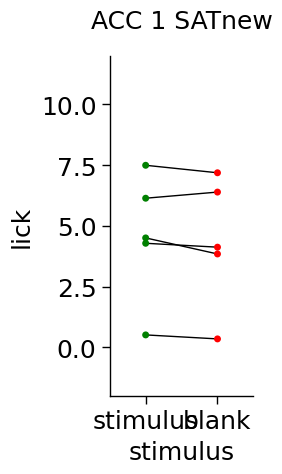

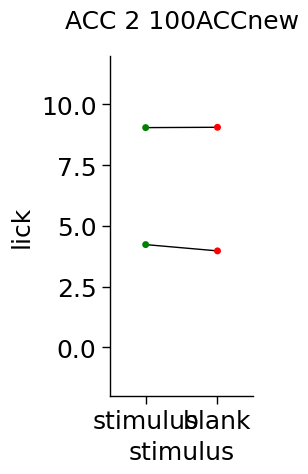

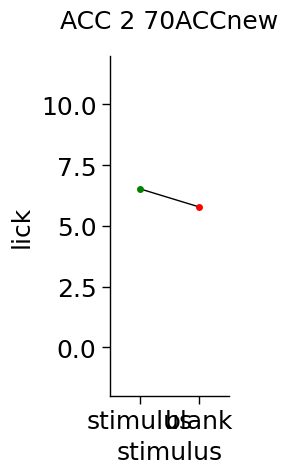

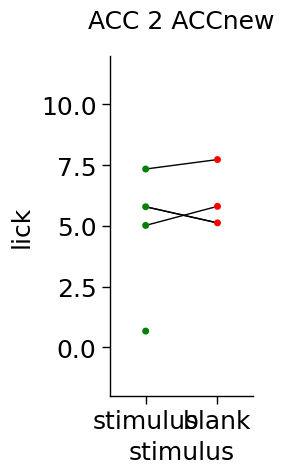

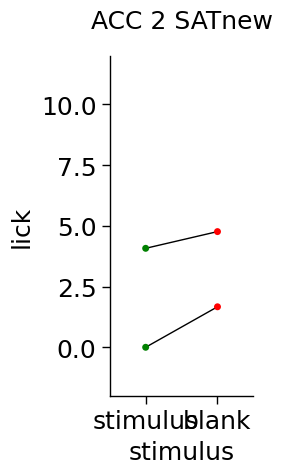

In [522]:
for day in nthpart_lickfreq["Day"].unique():
    if 'ACC' in day:
        x=[1, 2]
        i=0
        conds = nthpart_lickfreq["condition"].unique()
        conds.sort()
        dayfilt = nthpart_lickfreq[nthpart_lickfreq["Day"] == day]
        for c in conds:
            condfilt = dayfilt[dayfilt["condition"]==c]
            if not condfilt.empty and 'new' in c:
                print(condfilt)
                g = sns.catplot(condfilt, y="lick",x="stimulus", order=["stimulus", "blank"],kind="strip", 
                        hue="stimulus", palette=["green", "red"], 
                        hue_order=["stimulus", "blank"],
                        col="condition", jitter=False, aspect=0.5, legend=False)
                segs = []
                for a in condfilt["animal"].unique():
                    anfilt = condfilt[condfilt["animal"] == a]
                    bl = anfilt[anfilt["stimulus"] == "blank"]["lick"].reset_index(drop=True)
                    st = anfilt[anfilt["stimulus"] == "stimulus"]["lick"].reset_index(drop=True)
                    if (len(bl) != 0) & (len(st) != 0):
                        add=[[0, st[0]], [1,bl[0]]]
                    segs.append(add)
                linesegs = LineCollection(segs,color='k', lw=1)
                g.axes_dict[c].add_collection(linesegs)
                g.axes_dict[c].set_ylim([-2, 12])
                g.axes_dict[c].set_title(f"{day} {c}")
    #            g.axes_dict[c].set_xticklabels(g.axes_dict[c].get_xticklabels(), rotation=70, ha="right")
                i+=1
            #g.figure.suptitle(day, y=1.05)
conds


Number of trials by trial type

### 2.1.3 Statistical Tests, filtered

Total number of trials between groups (should not be significantly different)

t-test if two conditions, ANOVA otherwise

In [49]:
res = []
cond = (daytotsfilt["condition"].str.contains("100")) | (daytotsfilt["condition"] == "Control")
tmp = daytotsfilt[cond]
tmp = tmp.sort_values("Day")
for day in tmp["Day"].unique(): 
    tt_separated = []
    for c in tmp["condition"].unique():
        tt_separated.append(tmp[(tmp["Day"] == day) & (tmp["condition"] == c)]["trial no"])
    if len(tmp["condition"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(tmp["condition"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))
pd.DataFrame(res, columns=["statistic", "pvalue"], index=tmp["Day"].unique())

,statistic,pvalue
ACC 1,NaN,NaN
ACC 2,-0.033202,0.973767
SAT 1,-1.933293,0.065662
SAT 2,1.836401,0.205003


In [148]:
res = []

al = daytotsfilt[(daytotsfilt["Day"] == "SAT 1") & (daytotsfilt["condition"].str.contains("100%"))]["trial no"]
for c in daytotsfilt["condition"].unique():
    if "100%" not in c:
        print(c)
        tt_separated = daytotsfilt[(daytotsfilt["Day"] == "SAT 1") & (daytotsfilt["condition"] == c)]["trial no"]
        res.append(stats.ttest_ind(al, tt_separated, equal_var=False))
 
pd.DataFrame(res, columns=["statistic", "pvalue"], index=daytotsfilt[~daytotsfilt["condition"].str.contains("100%")]["condition"].unique())

Control
hM4Di + CNO
hM4Di + DCZ
mCherry + CNO
mCherry + DCZ


,statistic,pvalue
Control,1.917418,0.067798
hM4Di + CNO,1.721311,0.104975
hM4Di + DCZ,2.291674,0.033242
mCherry + CNO,2.367443,0.032728
mCherry + DCZ,2.158140,0.044725


In [184]:
res = []
ind = []
perf = perf.sort_values("Time (hr)")
for h in perf[(perf["Time (hr)"] == 0)]["Time (hr)"].unique():
    tt_separated = []
    for c in perf["condition"].unique():
        for c2 in perf["condition"].unique():
            if ((len(perf[(perf["Time (hr)"] == h) & (perf["condition"] == c)]["lick"]) > 0) &
                (len(perf[(perf["Time (hr)"] == h) & (perf["condition"] == c)]["lick"]) > 0)):
                res.append(stats.ttest_ind(perf[(perf["Time (hr)"] == h) & (perf["condition"] == c)]["lick"], 
                                        perf[(perf["Time (hr)"] == h) & (perf["condition"] == c2)]["lick"], equal_var=False))
                ind.append((c + " & " + c2 + " @ " + str(h)))

#ind = perf[(perf["Time (hr)"] >= -24 )& (perf["Time (hr)"] <= 24)][["Time (hr)", "condition"]].apply(tuple, axis=1).unique()

r = pd.DataFrame(res, columns=["statistic", "pvalue"], index=ind)

In [185]:
r

,statistic,pvalue
mCherry + CNO & mCherry + CNO @ 0.0,0.000000,1.000000e+00
mCherry + CNO & hM4di + DCZ @ 0.0,2.623594,9.754810e-03
mCherry + CNO & mCherry + DCZ @ 0.0,0.762737,4.484118e-01
mCherry + CNO & Control @ 0.0,8.104625,1.880681e-14
mCherry + CNO & hM4Di + CNO @ 0.0,4.271471,2.662728e-05
"mCherry + CNO & 100% ACC, 80% SAT @ 0.0",6.011602,6.089830e-09
hM4di + DCZ & mCherry + CNO @ 0.0,-2.623594,9.754810e-03
hM4di + DCZ & hM4di + DCZ @ 0.0,0.000000,1.000000e+00
hM4di + DCZ & mCherry + DCZ @ 0.0,-0.618468,5.379513e-01
hM4di + DCZ & Control @ 0.0,3.708842,2.806852e-04


Total number of trials across days (should not be significantly different)

t-test if only 2 days, ANOVA otherwise

In [150]:
res = []
for c in total_by_day["condition"].unique(): 
    tt_separated = []
    tmp = total_by_day[total_by_day["condition"] == c]
    for day in tmp["Day"].unique():
        tt_separated.append(total_by_day[(total_by_day["Day"] == day) & (total_by_day["condition"] == c)]["trial no"])
    if len(total_by_day["Day"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(total_by_day["Day"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))

        
pd.DataFrame(res, columns=["statistic", "pvalue"], index=total_by_day["condition"].unique())

ValueError: Length of values (6) does not match length of index (23)

Last 20% of trials for all days of SAT

In [179]:
res = []

stimcond = nthpart_lickfreq["stimulus"] == "stimulus"
blankcond = nthpart_lickfreq["stimulus"] == "blank"

conds = nthpart_lickfreq["condition"].unique()

ind = nthpart_lickfreq[nthpart_lickfreq["day_delta"] >= pd.to_timedelta(0)][["Day", "condition"]].apply(tuple, axis=1).unique()

for day, c in ind:
    daycond = nthpart_lickfreq["Day"] == day
    ccond = nthpart_lickfreq["condition"] == c
    stim = nthpart_lickfreq[stimcond & daycond & ccond]["lick"]
    blank = nthpart_lickfreq[blankcond & daycond & ccond]["lick"]
    res.append(stats.ttest_ind(stim, blank, equal_var=False))

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[1] + ", " + x[0]))

,statistic,pvalue
"100% ACC, 80% SAT, SAT 1",2.308246,0.029522
"100% ACC, 80% SAT, SAT 2",NaN,NaN
"Control, SAT 1",0.260509,0.796401
"Control, SAT 2",-0.138489,0.903059
"hM4Di + CNO, SAT 1",1.931412,0.066740
"hM4Di + CNO, SAT 2",NaN,NaN
"hM4Di + DCZ, SAT 1",-0.142070,0.888321
"hM4Di + DCZ, SAT 2",0.701765,0.511365
"mCherry + CNO, SAT 1",0.902818,0.375701
"mCherry + CNO, SAT 2",0.470078,0.709052


## 2.2 Lick frequency for entire trial


If `freq_window` is not `None` data will be averaged with a rolling window of the
given length. Data will then be averaged into discrete time bins the legnth of
`freq_bin`. If `freq_bin` is the rate at which data is sampled (every 100ms),
then instentaneous lick frequency will be averaged across animals. 

Parameters

In [112]:
freq_window = None # milliseconds, length of rolling window
freq_bin = 100 # milliseconds, length of discrete time bin
time_bin = 4*60

### 2.2.1 Analysis

In [113]:
keys["millis bin"] = "puff delta"
time_bin = 4*60 # minutes

data = full_lickfreq(df, freq_window, freq_bin, time_bin, keys, keep, values)

flkeep = keep + ["Time (hr)", "delta", "Day", "day_delta", "puff delta", "Time (ms)"]

keys["time bin"] = "delta"
means, flcounts, perf = agg(data, keys, index, flkeep, values)
daytots = sum_trials(flcounts, index + ["Day"],[], "trial no")
hourtots = sum_trials(flcounts, index + ["Time (hr)"],[], "trial no")

mins["min_trials"] = 10 # minimum number of trials in a bin to keep
mins["min_blank"] = 1 # minimum number of water trials
mins["min_stimulus"] = 1 # minimum number of water trials

data_filtered = drop_group(data, mins, keys, "trial no", index, flkeep)
filtmeans, flfiltcounts, filtperf = agg(data_filtered, keys, index, flkeep, values)
daytotsfilt = sum_trials(flfiltcounts, index + ["Day"], [],"trial no")
hourtotsfilt = sum_trials(flfiltcounts, index + ["Time (hr)"], [],"trial no")

animal
GSB8                    2019-06-02 12:00:00
GXS4                    2019-07-16 12:00:00
GXS5                    2019-07-17 12:00:00
JND2                    2020-12-19 12:00:00
JSS4                    2021-02-27 12:00:00
LYO2                    2022-03-04 12:00:00
LYO3                    2022-03-04 12:00:00
MBR1                    2022-04-04 12:00:00
MMY10                   2022-06-20 12:00:00
MMY7                    2022-06-20 12:00:00
MYS2                    2022-09-27 12:00:00
MZI1                    2022-10-04 12:00:00
NFZ13                   2022-11-20 12:00:00
NFZ4                    2022-11-20 12:00:00
NGX5                    2022-12-02 12:00:00
NGZ1                    2022-11-30 12:00:00
NJO1                    2022-12-14 12:00:00
NKZ10                   2022-12-28 12:00:00
NKZ3                    2022-12-27 12:00:00
NKZ4                    2022-12-27 12:00:00
NKZ7                    2022-12-27 12:00:00
NLB1                    2022-12-29 12:00:00
NLB10                   2

### 2.2.2 Plotting

Instentaneous licking frequency for stimulus and blank trials for entire trial

In [114]:
filtmeans['Time (hr)'] = filtmeans['Time (hr)'] + 2

In [120]:
f_RS[f_RS['animal'] == 'NGZ1']

,condition,animal,delta,puff delta,stimulus,lick,poke,Age,Sex,Strain,acc,Cage,before 2023,type,timing,Time (hr),Day,day_delta,Time (ms),water
38492,RS_ACC3old,NGZ1,-2 days +04:00:00,-1 days +23:59:59.800000,blank,3.000000,7.000000,NaN,F,Sscre,2 days,None,None,no water & blank,old,-42.0,ACC -1,-2 days,-200.0,no water
38493,RS_ACC3old,NGZ1,-2 days +04:00:00,-1 days +23:59:59.800000,stimulus,2.000000,7.000000,NaN,F,Sscre,2 days,None,None,water & stimulus,old,-42.0,ACC -1,-2 days,-200.0,water
38494,RS_ACC3old,NGZ1,-2 days +04:00:00,-1 days +23:59:59.900000,blank,1.000000,6.000000,NaN,F,Sscre,2 days,None,None,no water & blank,old,-42.0,ACC -1,-2 days,-100.0,no water
38495,RS_ACC3old,NGZ1,-2 days +04:00:00,-1 days +23:59:59.900000,stimulus,3.000000,6.666667,NaN,F,Sscre,2 days,None,None,water & stimulus,old,-42.0,ACC -1,-2 days,-100.0,water
38496,RS_ACC3old,NGZ1,-2 days +04:00:00,0 days 00:00:00,blank,3.000000,7.000000,NaN,F,Sscre,2 days,None,None,no water & blank,old,-42.0,ACC -1,-2 days,0.0,no water
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40759,RS_ACC3old,NGZ1,0 days 20:00:00,0 days 00:00:01.700000,stimulus,3.372093,0.348837,NaN,F,Sscre,2 days,None,None,water & stimulus,old,22.0,SAT 1,0 days,1700.0,water
40760,RS_ACC3old,NGZ1,0 days 20:00:00,0 days 00:00:01.800000,blank,4.090909,2.272727,NaN,F,Sscre,2 days,None,None,no water & blank,old,22.0,SAT 1,0 days,1800.0,no water
40761,RS_ACC3old,NGZ1,0 days 20:00:00,0 days 00:00:01.800000,stimulus,2.597403,0.519481,NaN,F,Sscre,2 days,None,None,water & stimulus,old,22.0,SAT 1,0 days,1800.0,water
40762,RS_ACC3old,NGZ1,0 days 20:00:00,0 days 00:00:01.900000,blank,5.714286,8.571429,NaN,F,Sscre,2 days,None,None,no water & blank,old,22.0,SAT 1,0 days,1900.0,no water


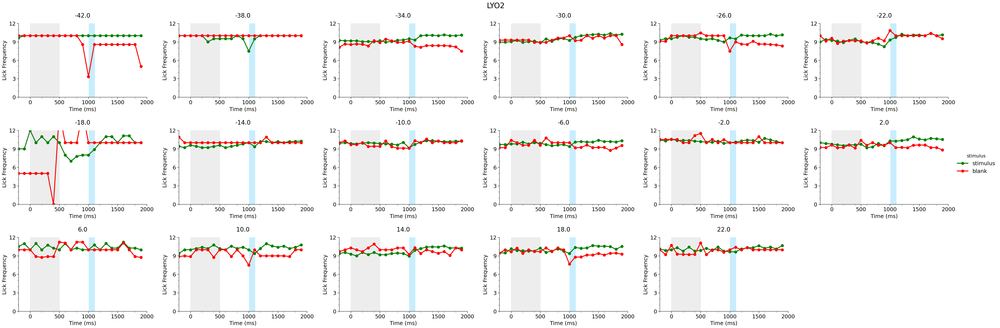

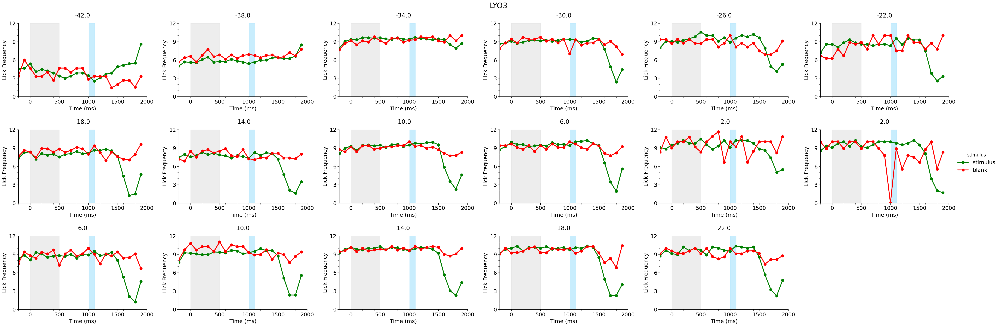

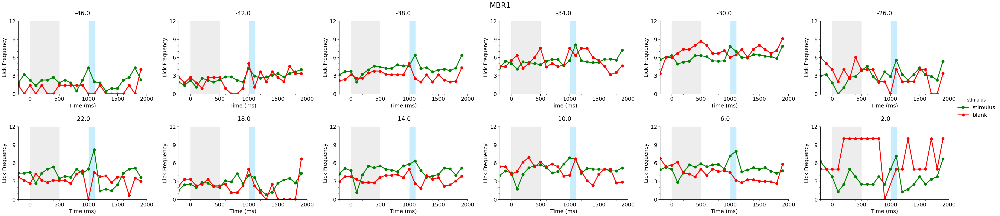

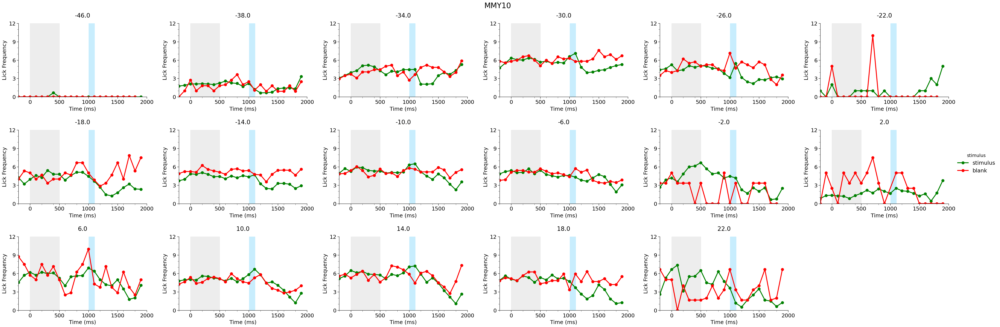

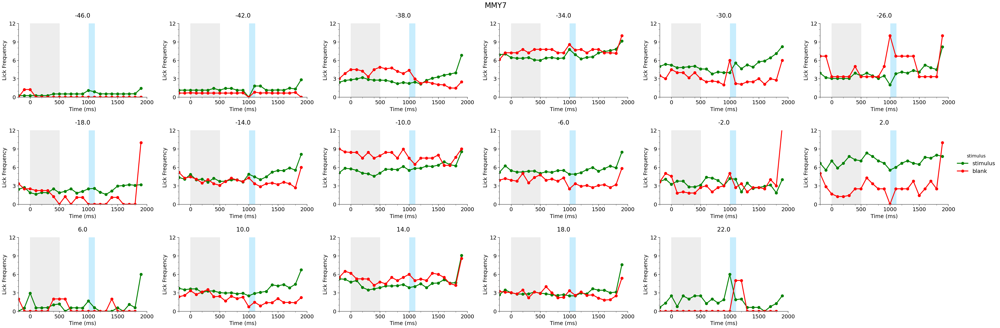

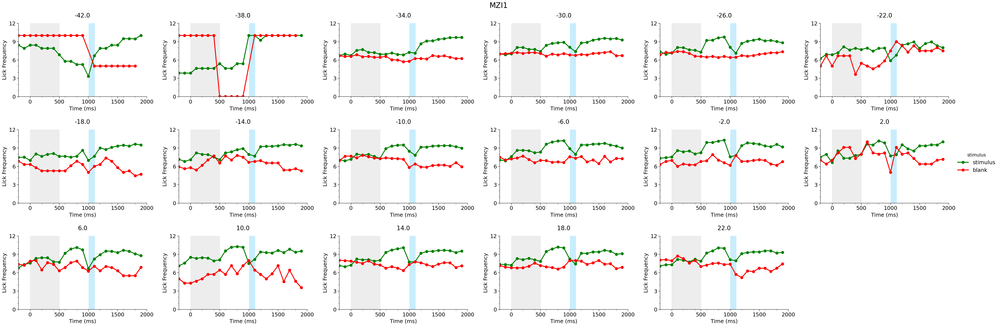

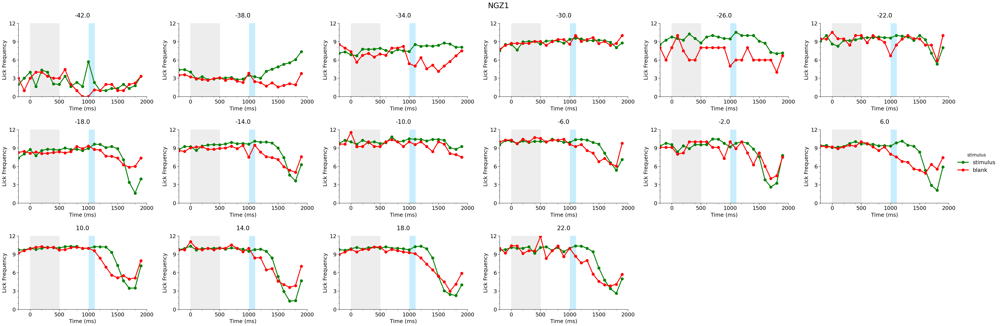

In [121]:
f_RS = filtmeans[filtmeans['condition'].str.contains('RS')]
for c in f_RS['animal'].unique():
    if c != 'MYS2':
        plot_lickfreq(f_RS[(f_RS['animal'] == c) & (f_RS['Time (hr)'] >= -48) & (f_RS['Time (hr)'] <=24)], suptitle=c,
                        col_wrap=6,errorbar='se', err_style='bars', err_kws={'lw':0.7})

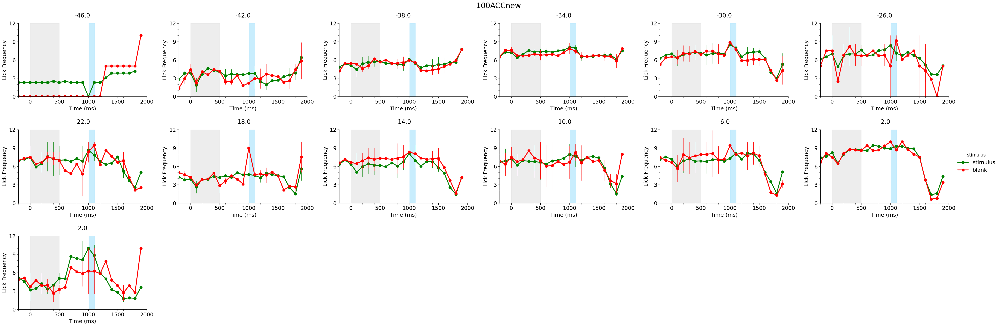

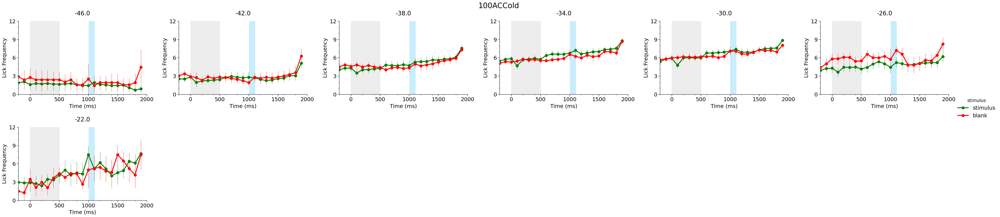

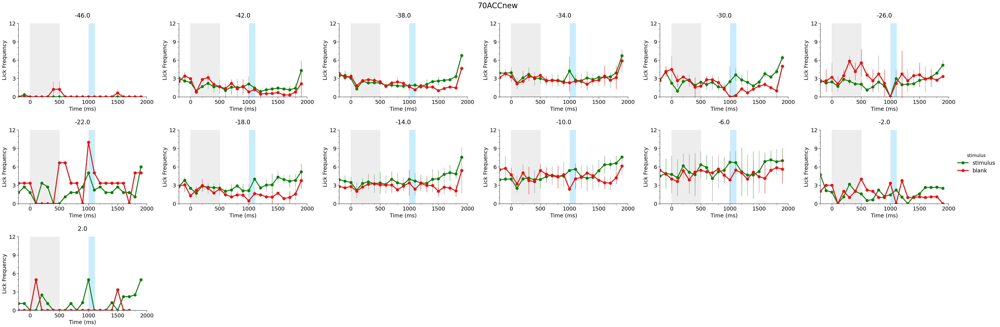

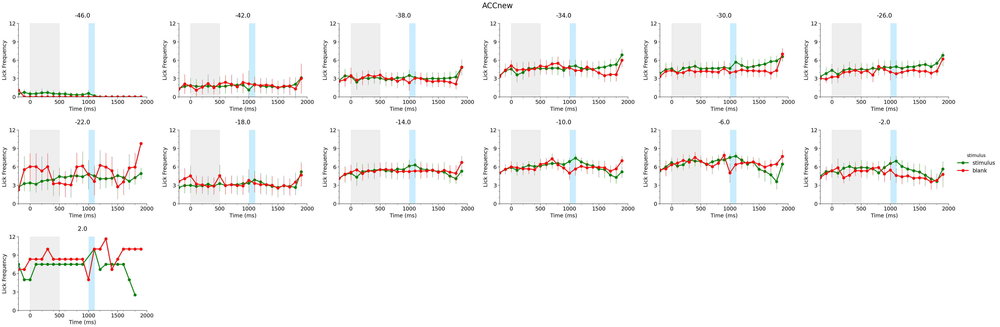

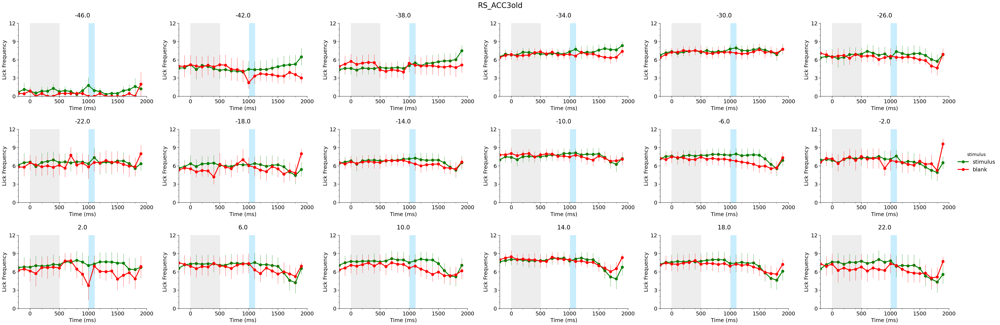

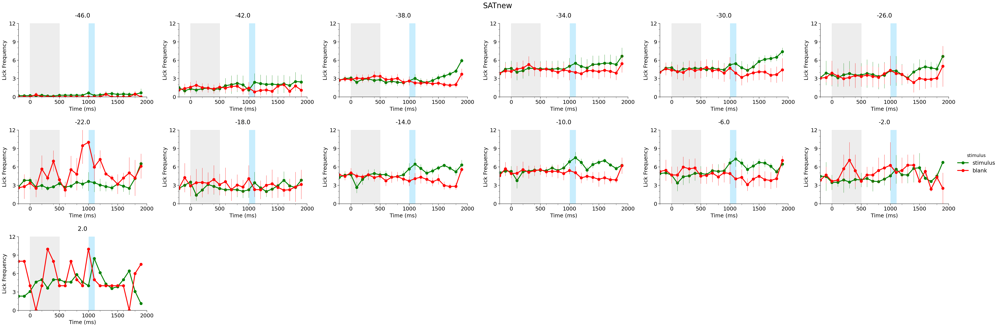

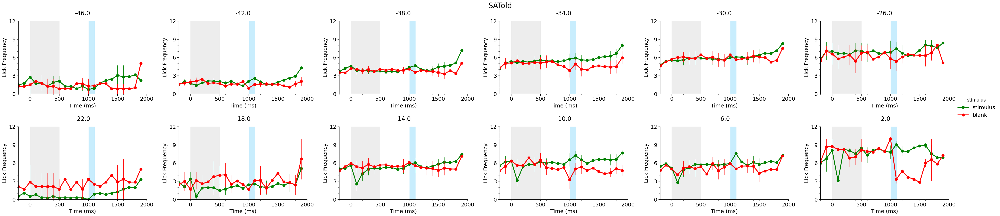

In [122]:
for c in filtmeans['condition'].unique():
    plot_lickfreq(filtmeans[(filtmeans['condition'] == c) & (filtmeans['Time (hr)'] >= -48) & (filtmeans['Time (hr)'] <=24)], suptitle=c,
                    col_wrap=6,errorbar='se', err_style='bars', err_kws={'lw':0.7})

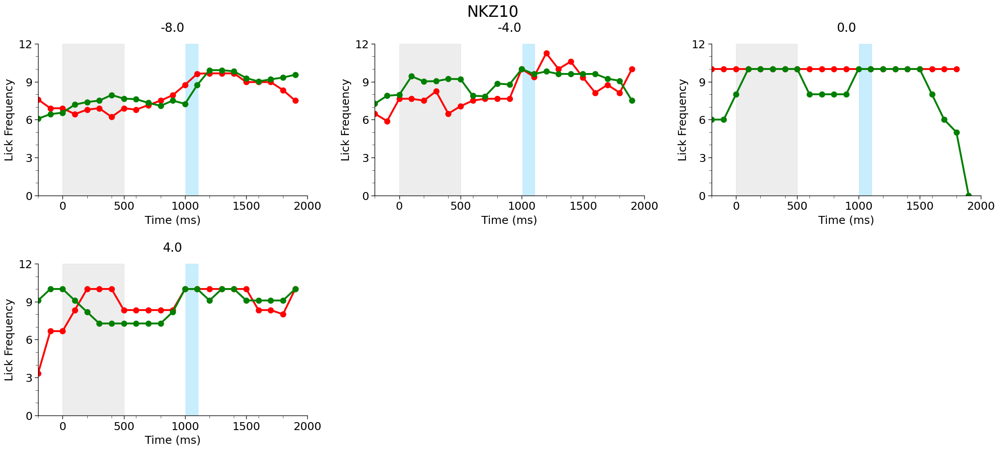

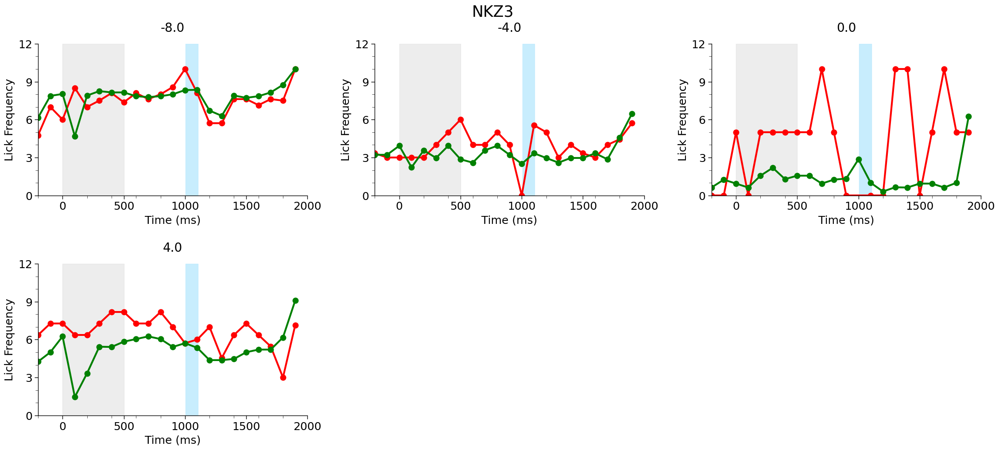

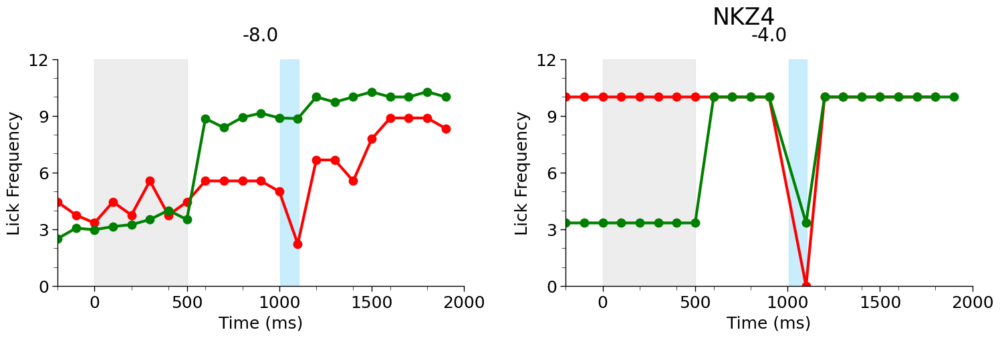

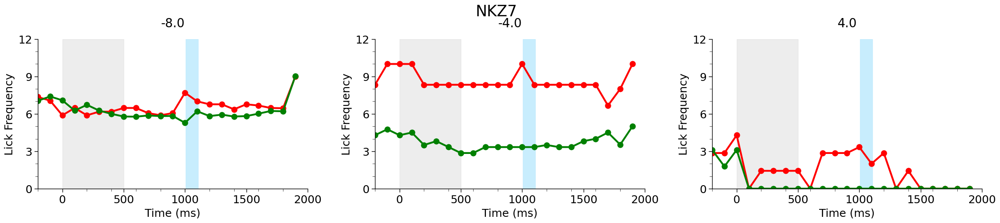

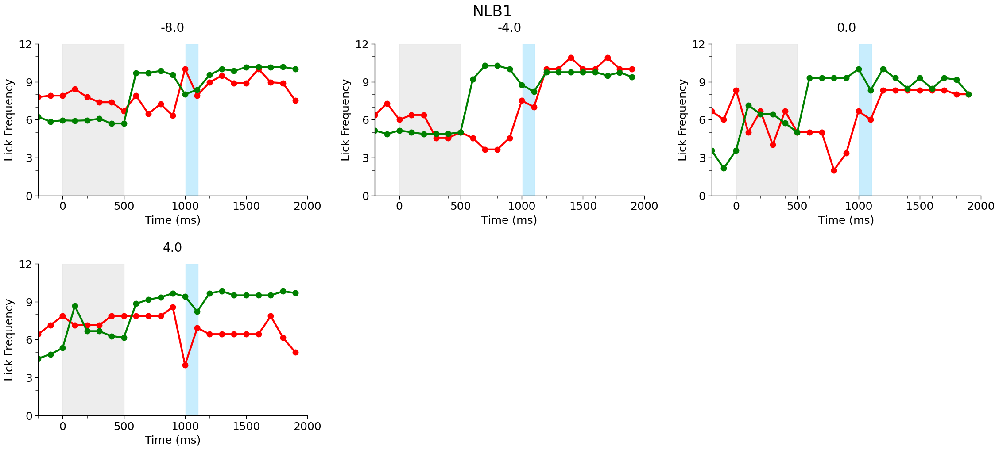

...

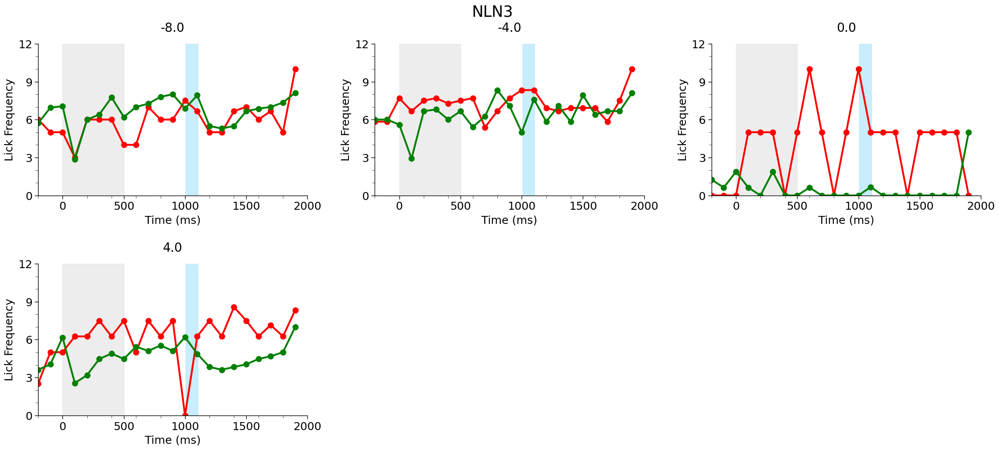

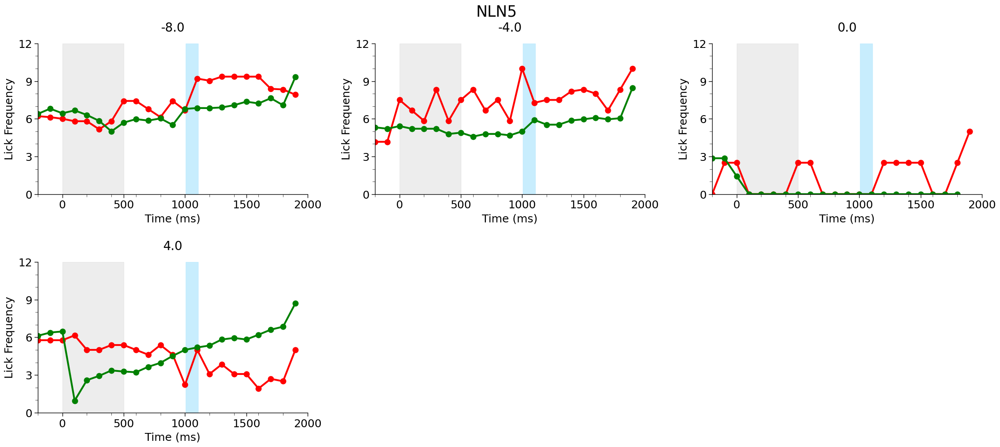

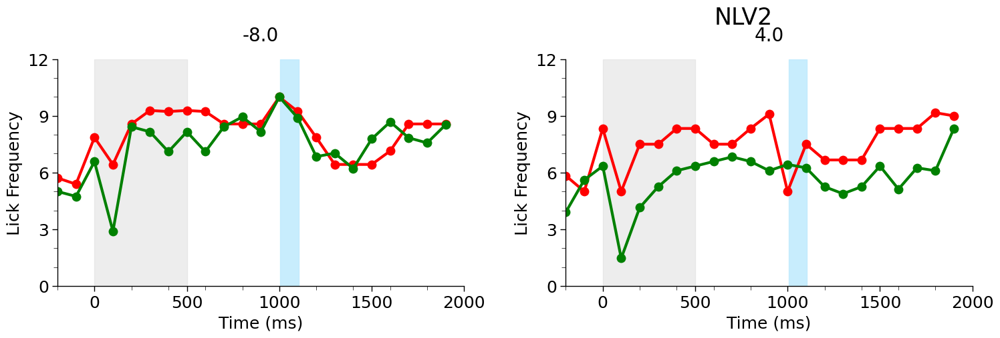

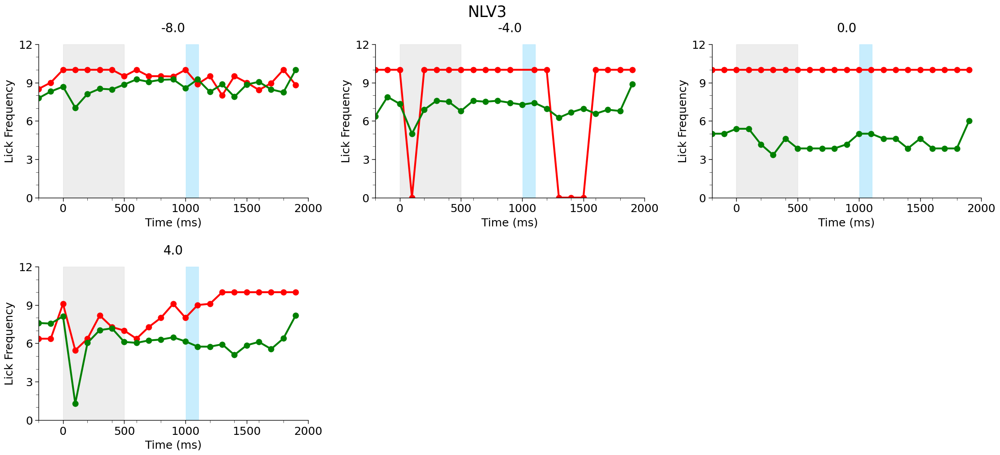

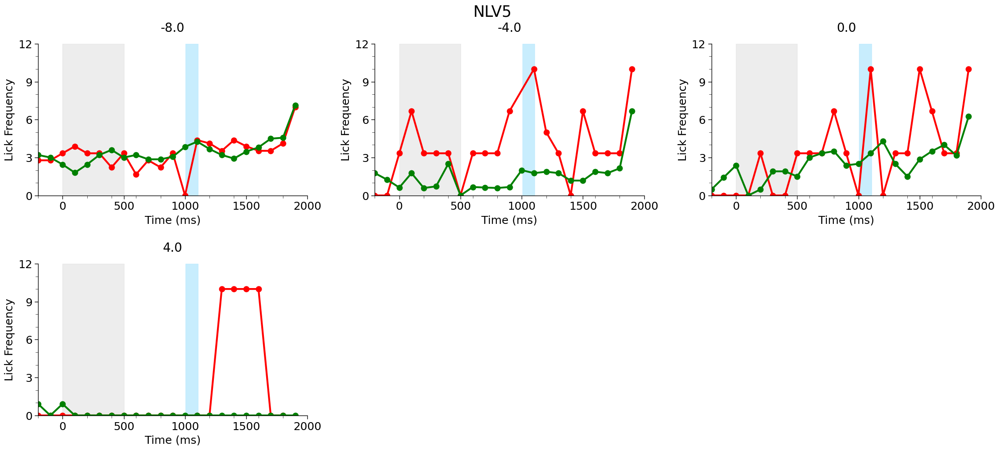

In [68]:

p=["red", "green"]
ordr=["blank", "stimulus"]
tmp = filtmeans[filtmeans["condition"].str.contains('100')]
t = ((tmp["Time (hr)"] <= 4) & (tmp["Time (hr)"] >= -8))
for c in tmp["animal"].unique(): 
    plot_data = tmp[t & (tmp["animal"] == c)]
    if plot_data.empty:
        print(c)
    else: 
        plot_lickfreq(plot_data, suptitle=c, hue="stimulus", hue_order=ordr, 
            palette=p, col_wrap=3, legend=False )


In [125]:
th = total_by_hour[(total_by_hour["Time (hr)"] <= 20) & (total_by_hour["Time (hr)"] >= 16)]
th.groupby(["condition", "Time (hr)"])["trial no"].mean().unstack(level="Time (hr)")

Time (hr),16.0,20.0
condition,,
"100% ACC, 80% SAT",108.785714,61.166667
Control,92.583333,77.000000
hM4Di + CNO,87.083333,38.375000
hM4Di + DCZ,97.222222,32.400000
mCherry + CNO,71.692308,41.111111
mCherry + DCZ,82.200000,28.500000


Performance (L<sub>stim</sub> - L<sub>blank</sub>) for entire trial, comparing
timebins together across groups

In [80]:
time_bin = 4*60
data = lickfreq_analysis(df, freq_window, freq_bin, time_bin)
mean_statistics, counts, perf = aggregate_analysis(data, min_trials, min_blank_trials, min_water_trials, ["day_delta", "type"])

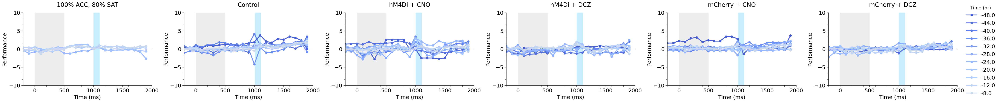

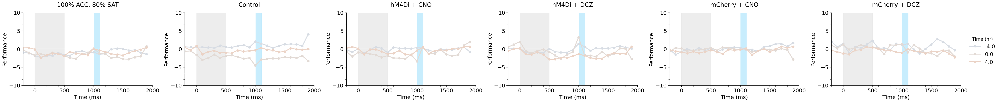

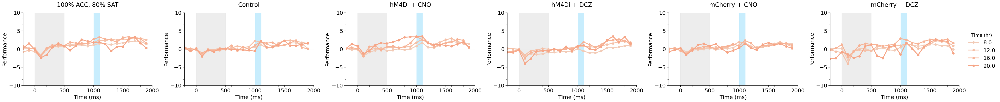

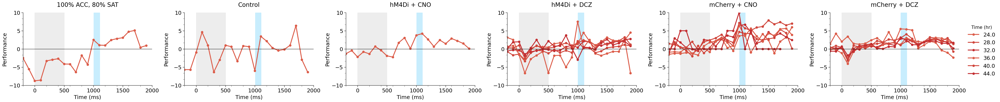

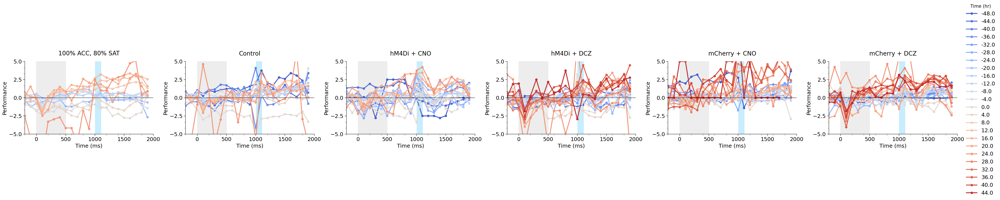

In [97]:
acc = ( (filtperf["Time (hr)"] < -4) )
early = ( (filtperf["Time (hr)"] < 8) & (filtperf["Time (hr)"] >= -4) )
late = ( (filtperf["Time (hr)"] >= 8) & (filtperf["Time (hr)"] < 24))
later = ( (filtperf["Time (hr)"] >= 24) )
ylim = [-5,5]
# ensures palette is centered around 0
num_bins = (len(filtperf[acc]["Time (hr)"].unique()) + 1) * 2
pl = sns.color_palette("coolwarm", n_colors=num_bins)

# 12 4h bins in ACC48 
plot_perf(filtperf[acc], palette=pl[0:11],ms=8, col="condition")

# first 2 SAT timebins (SAT8)
plot_perf(filtperf[early], palette=pl[11:14],ms=8, col="condition")

# rest of SAT
plot_perf(filtperf[late], palette=pl[14:21],ms=8, col="condition")

plot_perf(filtperf[later], palette=pl[21:],ms=8, col="condition")

# all together
plot_perf(filtperf, palette=pl,ms=8, col="condition", ylim=ylim)


Performance (L<sub>stim</sub> - L<sub>blank</sub>) for entire trial, comparing
groups together across timebins

## 2.3 Lick frequency during Puff

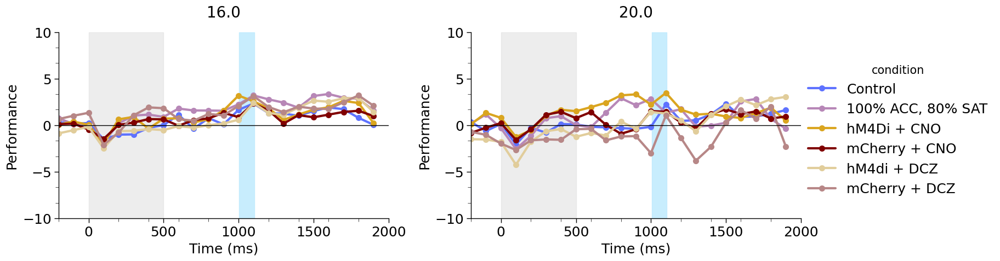

In [124]:
p = [sat, all_reward, "goldenrod", "maroon", dcz_hm4di, dcz_mcherry]
ordr=["Control", "100% ACC, 80% SAT", "hM4Di + CNO", "mCherry + CNO", "hM4di + DCZ", "mCherry + DCZ"]
#cond = (perf["Time (hr)"] == 0) | (perf["Time (hr)"] == 4) 
cond = (perf["Time (hr)"] == 16) | (perf["Time (hr)"] == 20) 
#cond = cond & ((perf["condition"].str.contains("100%")) | (perf["condition"].str.contains("Control")))

plot_perf(perf[cond], col="Time (hr)", hue="condition", ms=8, palette=p, hue_order=ordr,col_wrap=2, legend=True)

### 2.3.1 Lick frequency analysis

In [48]:
r = (0, 300)
puff_data = bin_lickfreq_analysis(df, r, time_bin)

In [49]:
puff_mean_statistics, puff_counts, puff_perf = bin_aggregate_analysis(puff_data, min_trials, min_blank_trials, min_water_trials, ["type"])

### 2.3.2 Plotting

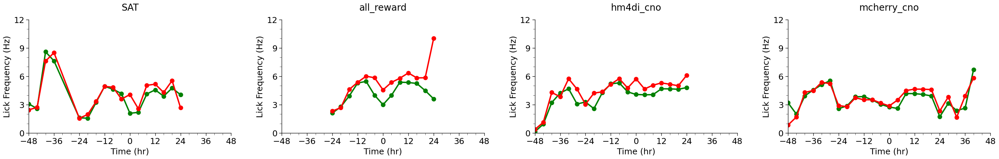

In [50]:

plot_ant_lickfreq(puff_mean_statistics, legend=False, xlim=[-48, 48], col="condition")

## 2.4 Bout analysis


Bout boundaries are defined as 2 consecutive trials being more than 2 minutes
apart, based on visual investigation of raster plots of 
trial distributions of individual animals.

### 2.4.1 Analysis

In [238]:
#r = (-200, 0)
#ant_data = bin_lickfreq_analysis(df, r, time_bin)
#ant_mean_statistics, counts, ant_perf = bin_aggregate_analysis(ant_data, min_trials, min_blank_trials, min_water_trials, ["Day", "day_delta", "type"])
data = get_bouts(ant_data, ["animal"], "timestamp", "bout no", 2, "min")

In [239]:
# calculate bout statistics

# metadata
keep = data.groupby(["animal", "bout no"]).last()[["condition", "Age", "Sex", "Strain", "Cage", "Time (hr)", "stimulus", "year"]]

# bout length (time of last sample in bout - time of first sample in bout)
bout_start = data.groupby(["animal", "bout no"]).first()["timestamp"] 
bout_end = data.groupby(["animal", "bout no"]).last()["timestamp"]
bout_end_identity = data.groupby(["animal", "bout no"]).last()[["timestamp","stimulus"]]
bout_len = (bout_end - bout_start).rename("bout len")

# intra bout iti (first sample of trial - last sample of previous trial)
intra_bt_trial_start = data.groupby(["animal", "bout no", "trial no"]).first()["timestamp"]
intra_bt_trial_end = data.groupby(["animal", "bout no", "trial no"]).last()["timestamp"]
intra_bt_iti = (intra_bt_trial_start - intra_bt_trial_end.groupby(["animal", "bout no"]).shift()).rename("intra bout iti")
intra_bt_iti = intra_bt_iti.groupby(["animal", "bout no"]).mean()
num_trials = intra_bt_trial_start.groupby(["animal", "bout no"]).count().rename("num trials")

# inter bout interval (first sample in bout - last sample in previous bout)
ibi = (bout_start - bout_end.groupby(["animal"]).shift()).rename("ibi")

# concat stats and metatdata together
bout_stats = pd.concat([keep, bout_len, ibi, intra_bt_iti, num_trials], axis=1).reset_index()

# convert to float
# handle NaT (i.e. first trial in bout for iti and ibi) by setting to -1 then 
# resetting all values less than 1 to NA 
# (hacky, but works because no iti or ibi should ever be < 0)
bout_stats["bout len"] = bout_stats["bout len"].to_numpy(dtype="timedelta64[ms]").astype("float")/(1000.)
bout_stats["ibi"] = bout_stats["ibi"].to_numpy(dtype="timedelta64[m]", na_value=-1).astype("float")/60.
bout_stats.loc[bout_stats["ibi"] < 0,"ibi"] = pd.NA
bout_stats["intra bout iti"] = bout_stats["intra bout iti"].to_numpy(dtype="timedelta64[ms]", na_value=-1).astype("float")/1000.
bout_stats.loc[bout_stats["intra bout iti"] < 0,"intra bout iti"] = pd.NA

# calculate trial frequency (number of trials/length of bout)
bout_stats["frequency"] = bout_stats["num trials"]/bout_stats["bout len"]

### 2.4.2 Plotting

Bout length

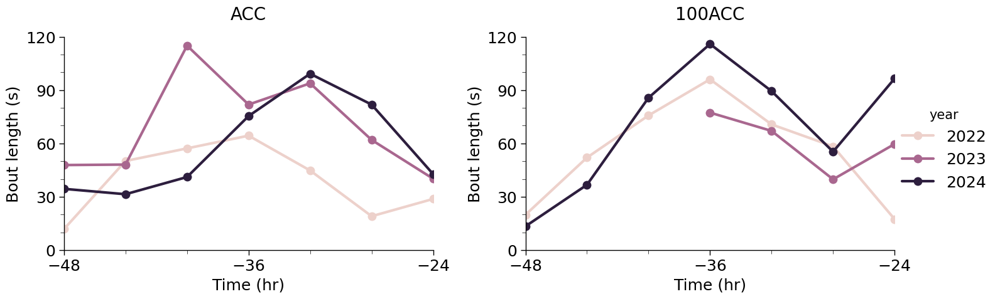

In [242]:
p = ["goldenrod", "maroon", 'b']
ordr=["hm4di", "mcherry", "SAT"]
bout_stats["cd"] = bout_stats["condition"].replace({"100ACCnew":"100ACC", "100ACCold":"100ACC", "SATold":"ACC", "SATnew":"ACC", "ACCnew":"ACC"})

plot_hr(bout_stats[bout_stats["year"] >= 2022], y="bout len", col='cd', hue="year",
              ylim=[0, 120], xlim=[-48, -24], ylabel="Bout length (s)")

Inter bout interval

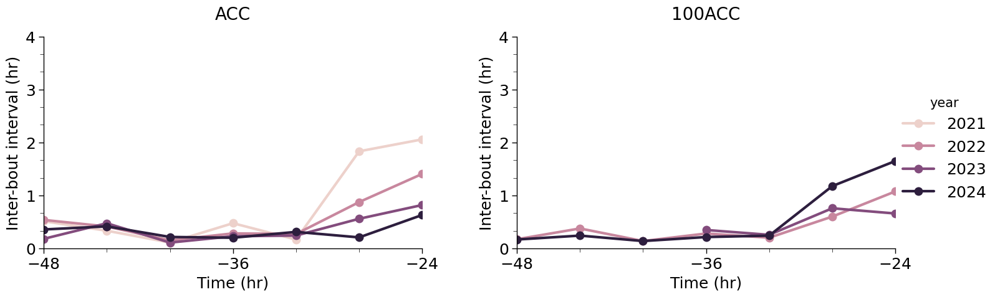

In [243]:
plot_hr(bout_stats[bout_stats["year"] >= 2021], y="ibi", hue="year", col='cd', 
              ylim=[0, 4],xlim=[-48, -24], ylabel="Inter-bout interval (hr)")

Intra-bout inter trial interval

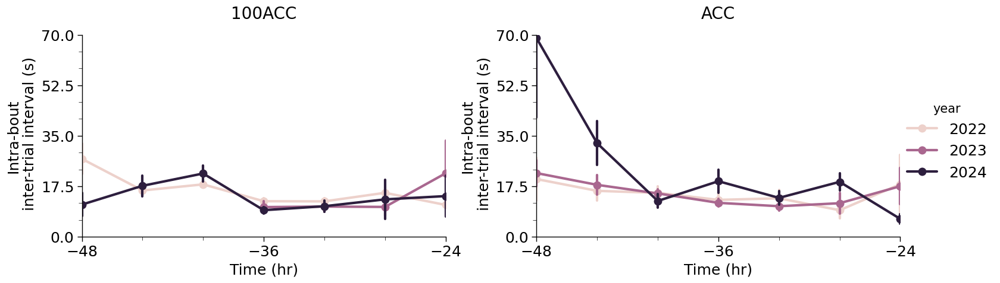

In [256]:
plot_hr(bout_stats[bout_stats["year"] > 2021], y="intra bout iti", hue="year", col='cd', 
              ylim=[0, 70],xlim=[-48, -24],ylabel="Intra-bout\n inter-trial interval (s)",errorbar='se', err_style='bars', col_order=["100ACC",'ACC'] )

Number of trials per bout

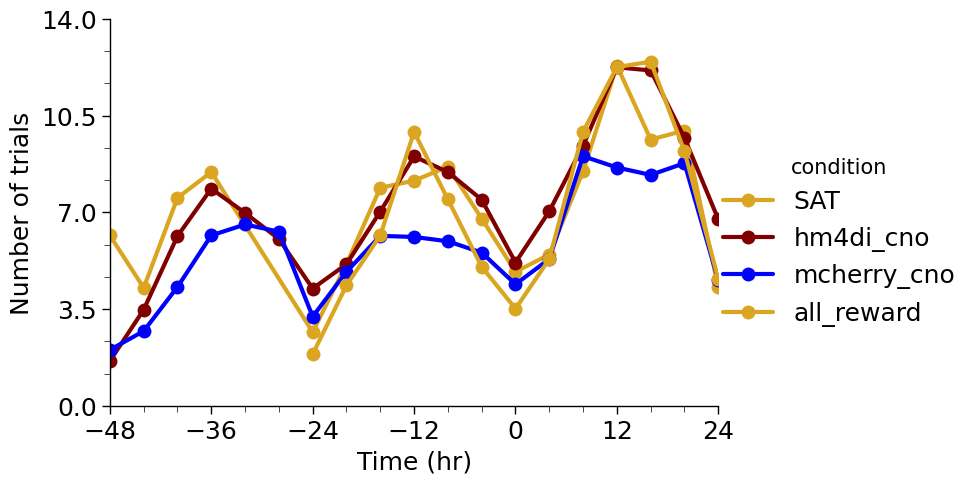

In [38]:
plot_hr(bout_stats, y="num trials", hue="condition", col=None, 
              ylim=[0, 14], palette=p, ylabel="Number of trials")

Intra-bout trial frequency

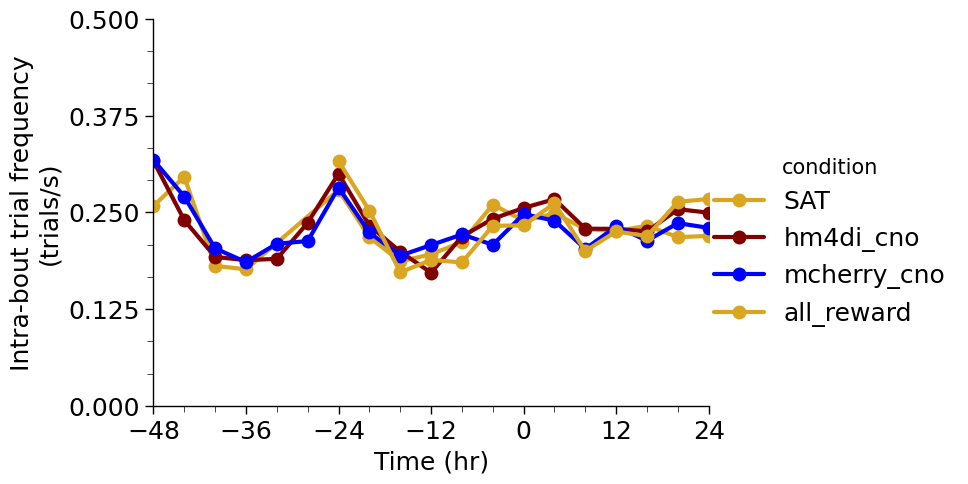

In [39]:
plot_hr(bout_stats, y="frequency", hue="condition", col=None, 
              ylim=[0, 0.5], palette=p, ylabel="Intra-bout trial frequency\n(trials/s)")

## 2.5 Anticipatory licking based on previous trial identity

Splitting data based on whether the previous trial was stimulus or blank. 
Using bout labeling to ensure that previous trials are consecutive.

### 2.5.1 Analysis

In [83]:
trial_ind = ["animal", "trial no"]
bout_ind = ["animal", "bout no"]
key = "stimulus"
n = 1
cond0 = "stimulus"
cond1 = "blank"
data = get_n_back(data, trial_ind, bout_ind, key, n, cond0, cond1)

untested for `n` $\geq$ `1`

In [93]:
def agg_by_prev_trial(data, agg_data, n, min_trials, min_blank_trials, min_water_trials, keep):
    mean_statistics, counts, perf = agg_data
    mean_statistics["n_back"] = 0
    counts["n_back"] = 0
    perf["n_back"] = 0

    mean_statistics["back_type"] = "none"
    counts["back_type"] = "none"
    perf["back_type"] = "none"

    for i in range(1, n+1):
        cname = f'{i}_back'
        stimcond = data[cname] == "stimulus"
        bcond = data[cname] == "blank"
        for j in range(1, i):
            cname = f'{j}_back'
            stimcond = stimcond & (data[cname] == "stimulus")
            bcond = bcond & (data[cname] == "blank")
        prev_stim = data[data[cname] == "stimulus"]
        prev_blank = data[data[cname] == "blank"]

        ps_data = aggregate_analysis(prev_stim, min_trials, min_blank_trials, 
                                     min_water_trials, keep)
        ps_data = set_prev_info(ps_data, i, "stimulus")
        ps_mean, ps_counts, ps_perf = ps_data
        

        pb_data = aggregate_analysis(prev_blank, min_trials, min_blank_trials, 
                                     min_water_trials, keep)
        pb_data = set_prev_info(pb_data, i, "blank")
        pb_mean, pb_counts, pb_perf = pb_data
        

        mean_statistics = pd.concat([mean_statistics, ps_mean, pb_mean])
        counts = pd.concat([counts, ps_counts, pb_counts])
        perf = pd.concat([perf, ps_perf, pb_perf])
        return mean_statistics, counts, perf

In [94]:
# TODO: increase number of previous trials to label
n = 1
mean_w_prev, counts_w_prev, perf_w_prev = agg_by_prev_trial(data, (mean_statistics, counts, perf), n, min_trials, min_blank_trials, min_water_trials, ["type"])

In [86]:
# number of trials per bout
f = data.groupby(["condition", "animal", "Time (hr)", "bout no", "trial no"]).first().reset_index()

counts_prev = f.groupby(["condition","animal", "Time (hr)", "bout no", "stimulus", "1_back"]).count()
cts_gp = counts_prev.groupby(["condition", "animal", "Time (hr)", "stimulus", "1_back"])
mean_prev = cts_gp.mean().reset_index()
total_prev = cts_gp.sum().reset_index()

counts_stim = f.groupby(["condition","animal", "Time (hr)", "bout no", "stimulus"]).count()
cts_gp = counts_stim.groupby(["condition", "animal", "Time (hr)", "stimulus"])
mean_stim = cts_gp.mean().reset_index()
total_stim = cts_gp.sum().reset_index()

counts_all = f.groupby(["condition","animal", "Time (hr)", "bout no"]).count()
mean_all = counts_all.groupby(["condition", "animal", "Time (hr)"]).mean().reset_index()

### 2.5.2 Plotting

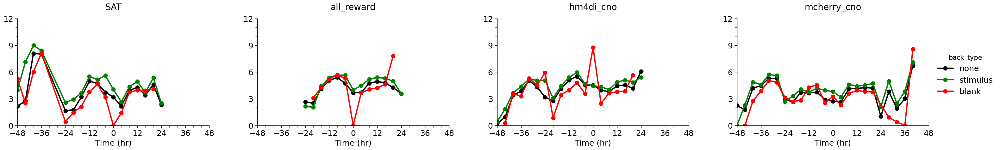

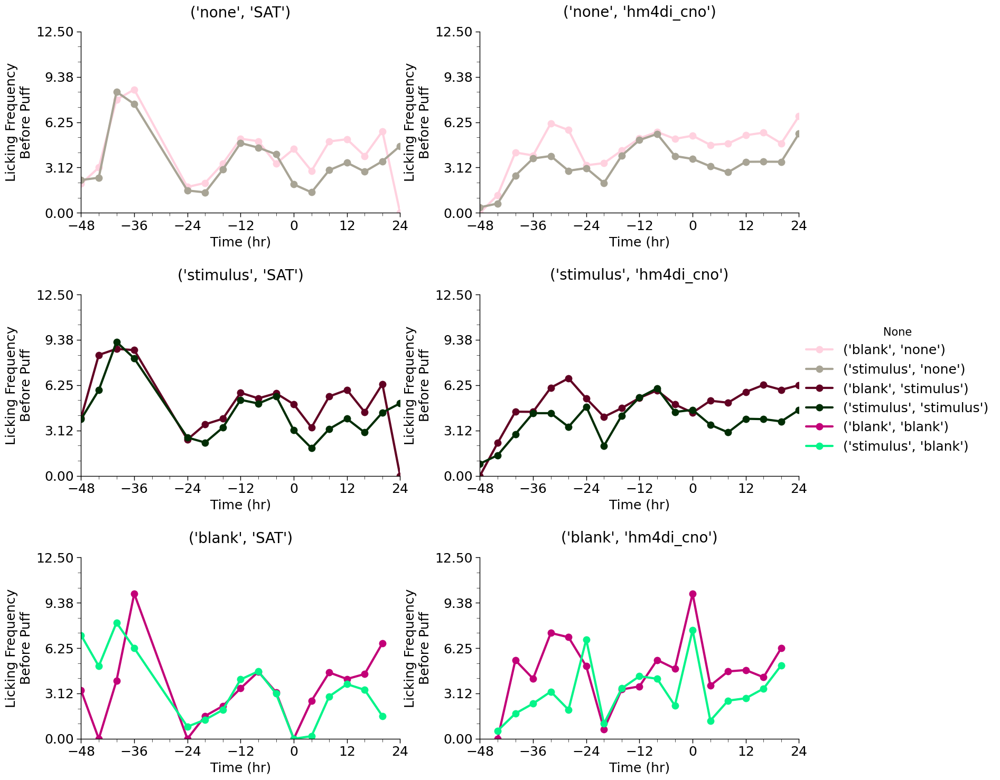

In [114]:
# anticipatory licking by previous trial contingency
ant = mean_w_prev[(mean_w_prev["Time (ms)"] == 100)] 

h = ant[['stimulus', 'back_type']].apply(tuple, axis=1)
p = ["xkcd:light pink", "xkcd:greyish", 
     "xkcd:burgundy",   "xkcd:dark forest green", 
     "xkcd:magenta",    "xkcd:turquoise green"]
ordr = [('blank', 'none'),     ('stimulus', 'none'), 
        ('blank', 'stimulus'), ('stimulus', 'stimulus'), 
        ('blank', 'blank'),    ('stimulus', 'blank')]
plot_hr(ant, col="condition", hue="back_type", palette=["black", "green", "red"],
        ylim=[0, 12], xlim=[-48, 48])
c = (ant["condition"] != "all_reward") & (ant["condition"] != "mcherry_cno")
h = ant[c][['stimulus', 'back_type']].apply(tuple, axis=1)

plot_hr(ant[c], col="condition",row="back_type", hue=h, palette=p, hue_order=ordr, 
        ylim=[0, 12.5], ylabel="Licking Frequency\nBefore Puff")

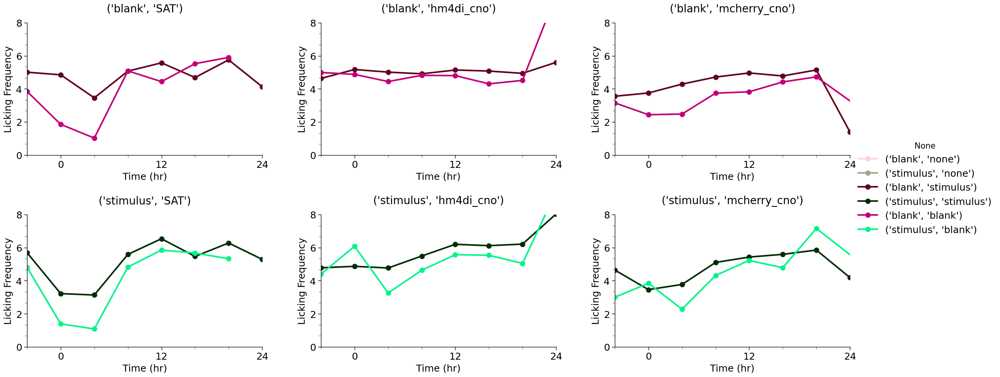

In [98]:
# anticipstory licking by previous trial contingency blank vs blank and stim vs stim
cond = (mean_w_prev["n_back"] < 2) & (mean_w_prev["back_type"] != "none") & (mean_w_prev["condition"] != "all_reward")
h = mean_w_prev[cond][['stimulus', 'back_type']].apply(tuple, axis=1)

plot_hr(mean_w_prev[cond], col="condition", row="stimulus", hue=h, palette=p, 
        hue_order=ordr, ylim=[0, 8], ylabel="Licking Frequency", xlim=[-4, 24])

In [113]:
h

33705    (stimulus, stimulus)
33707    (stimulus, stimulus)
33709    (stimulus, stimulus)
33711    (stimulus, stimulus)
33713    (stimulus, stimulus)
                 ...         
24535       (stimulus, blank)
24537       (stimulus, blank)
24539       (stimulus, blank)
24541       (stimulus, blank)
24543       (stimulus, blank)
Length: 3048, dtype: object

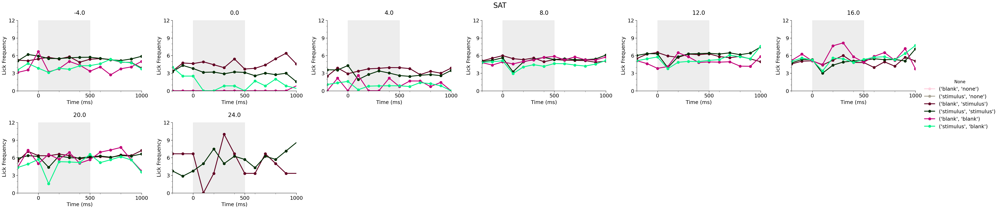

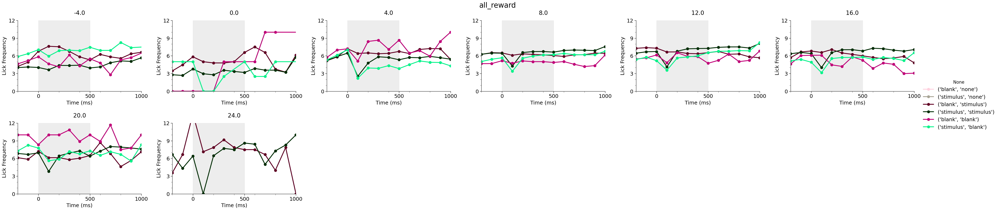

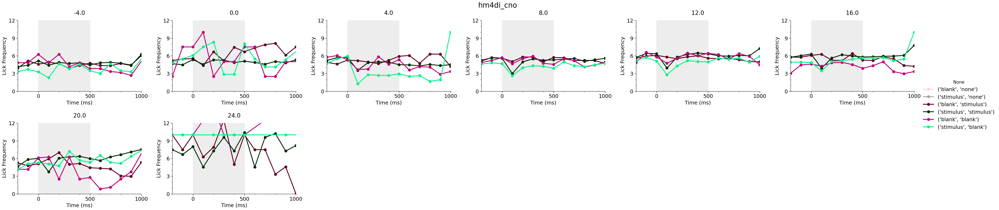

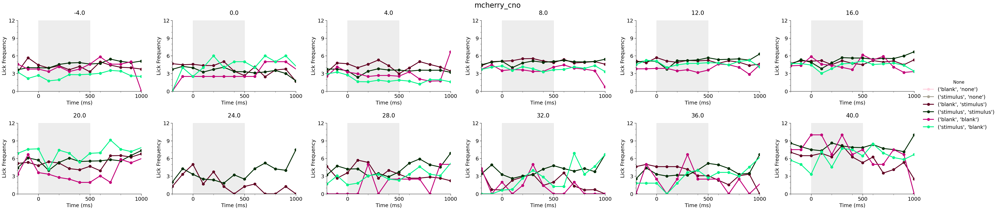

In [120]:
cond = ( (mean_w_prev["Time (hr)"] <= 48) & (mean_w_prev["Time (hr)"] >= -4) 
       & (mean_w_prev["n_back"] < 2) & (mean_w_prev["back_type"] != "none")
       #& (mean_w_prev["puff delta"] < 1000) 
       )

for condition in mean_w_prev["condition"].unique(): 
    plot_data = mean_w_prev[cond & (mean_w_prev["condition"] == condition)]
    h = plot_data[['stimulus', 'back_type']].apply(tuple, axis=1)
    plot_lickfreq(plot_data, suptitle=condition, hue=h, hue_order=ordr, 
                  palette=p, xlim=[-200, 1000])

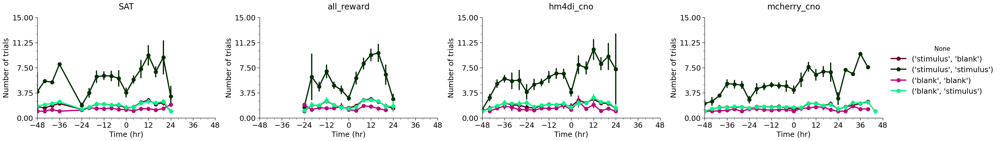

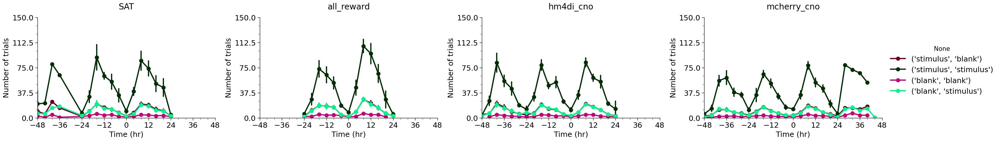

In [100]:
h = mean_prev[['1_back', 'stimulus']].apply(tuple, axis=1)
p = ["xkcd:burgundy", "xkcd:dark forest green", "xkcd:magenta", "xkcd:turquoise green"]
ordr = [('stimulus', 'blank'),
       ('stimulus', 'stimulus'), ('blank', 'blank'),
       ('blank', 'stimulus')]

# mean number of trials per bin
plot_trial_hr(mean_prev, hue=h, palette=p, hue_order=ordr, ylim=[0, 15], 
              fill=False)

# total number of trials per bin
plot_trial_hr(total_prev, hue=h, palette=p, hue_order=ordr, ylim=[0, 150],
              fill=False)

In [111]:
total_prev[total_prev["Time (hr)"] > 0].groupby(["condition", "1_back", "stimulus", "Time (hr)"])["trial no"].mean().unstack(level="Time (hr)")

Time (hr)                           4.0         8.0        12.0       16.0  \
condition   1_back   stimulus                                                
SAT         blank    blank      2.285714    4.583333   4.272727   3.222222   
                     stimulus   5.900000   19.538462  17.571429  11.615385   
            stimulus blank      7.666667   20.769231  19.230769  13.000000   
                     stimulus  39.444444   85.357143  73.714286  51.230769   
all_reward  blank    blank      2.111111    6.714286   4.714286   4.800000   
                     stimulus   9.307692   28.071429  20.285714  15.142857   
            stimulus blank      9.166667   27.571429  22.071429  15.071429   
                     stimulus  45.272727  107.285714  95.928571  66.285714   
hm4di_cno   blank    blank      3.000000    5.000000   4.583333   2.600000   
                     stimulus   8.181818   20.250000  16.250000  11.750000   
            stimulus blank      8.181818   20.916667  16.666667  12.000000   
                     stimulus  34.454545   82.916667  59.916667  54.000000   
mcherry_cno blank    blank      2.818182    5.214286   3.363636   3.100000   
                     stimulus   7.428571   17.357143  13.785714   8.615385   
            stimulus blank      8.142857   18.428571  14.642857   8.384615   
                     stimulus  34.307692   78.285714  52.857143  43.846154   

Time (hr)                           20.0       24.0  28.0  32.0  36.0  40.0  \
condition   1_back   stimulus                                                 
SAT         blank    blank      3.500000   2.000000   NaN   NaN   NaN   NaN   
                     stimulus  10.142857   3.000000   NaN   NaN   NaN   NaN   
            stimulus blank     10.714286   3.000000   NaN   NaN   NaN   NaN   
                     stimulus  45.285714   5.000000   NaN   NaN   NaN   NaN   
all_reward  blank    blank      1.666667        NaN   NaN   NaN   NaN   NaN   
                     stimulus   6.833333   3.000000   NaN   NaN   NaN   NaN   
            stimulus blank      6.428571   3.000000   NaN   NaN   NaN   NaN   
                     stimulus  27.666667   5.600000   NaN   NaN   NaN   NaN   
hm4di_cno   blank    blank      2.000000   1.500000   NaN   NaN   NaN   NaN   
                     stimulus   5.250000   2.500000   NaN   NaN   NaN   NaN   
            stimulus blank      5.375000   3.000000   NaN   NaN   NaN   NaN   
                     stimulus  21.333333  13.500000   NaN   NaN   NaN   NaN   
mcherry_cno blank    blank      2.500000   1.000000   4.0   7.0   4.0   4.0   
                     stimulus   4.777778   1.333333  13.0  16.0  11.0  14.0   
            stimulus blank      5.777778   2.666667  15.0  15.0  13.0  17.0   
                     stimulus  21.181818   6.250000  79.0  72.0  67.0  53.0   

Time (hr)                      44.0  
condition   1_back   stimulus        
SAT         blank    blank      NaN  
                     stimulus   NaN  
            stimulus blank      NaN  
                     stimulus   NaN  
all_reward  blank    blank      NaN  
                     stimulus   NaN  
            stimulus blank      NaN  
                     stimulus   NaN  
hm4di_cno   blank    blank      NaN  
                     stimulus   NaN  
            stimulus blank      NaN  
                     stimulus   NaN  
mcherry_cno blank    blank      NaN  
                     stimulus   1.0  
            stimulus blank      NaN  
                     stimulus   NaN

# 4. Output Results 

This will overwrite any previous output in the same folder, so make sure to 
move files or change the output directory if running the code multiple times.

### 4.1 Aggregate data

In [ ]:
# output_dir = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\refactor_4h'
# cols = ["condition", "animal", "stimulus", "Time (hr)", "Time (ms)", "lick"]
# mean_statistics.to_excel(f'{output_dir}lick_frequency.xlsx', columns=cols, index=False)

# cols = ["condition", "animal", "Time (hr)", "stimulus", "trial no"]
# counts.to_excel(f'{output_dir}trial_counts.xlsx', columns=cols, index=False)

# cols = ["condition", "animal", "Time (hr)", "Time (ms)", "lick"]
# perf.to_excel(f'{output_dir}performance.xlsx', columns=cols, index=False)

# with open(f'{output_dir}parameters.txt', mode='w') as f:
#     out = f'''csv_directory = {csv_directory}
# metadata_file = {metadata_file}
# default_acc_time = {default_acc_time} days

# time_bin = {time_bin} minutes
# freq_window = {freq_window} milliseconds, length of rolling window
# freq_bin = {freq_bin} milliseconds, length of discrete time bin

# min_trials = {min_trials} minimum number of trials in a bin to keep
# min_water_trials = {min_water_trials} minimum number of water trials
# min_blank_trials = {min_blank_trials} minimum number of water trials
# '''
#     f.write(out)

### 4.2 Raw lick frequency data

Takes a long time to run due to large number of samples 
(there are ~40k rows per animal)

In [ ]:
# raw data has too many lines to output to excel
# large number of samples means this takes a long time (~6s for 4 animals)
data.to_csv(f'{output_dir}rawlickfrequency.csv', index=False)

NameError: name 'output_dir' is not defined

# 5. Pipeline description

__Pipeline:__

>```
>raw data (csv) ------------|    loader.py                                                     lickfreq_analysis                                            
>                            |------------------> formatted data - many animals (dataframe) ---------------------------> trial-level analysis(dataframe)
>metadata (excel) ----------|
>
>                                     aggregate_analysis   |---> trial number counts by timebin and condition (dataframe) ---|
>trial-level analysis (dataframe) ------------------------|---> mean lick frequency by timebin (dataframe) -----------------|---> plots
>                                                          |---> performance by timebin (dataframe) -------------------------|
>```

***

__Formats__

*raw data*

>time (ms), poke, lick, condition code, delay, stimulus

- time measured from start of file
- poke in {0, 1}
- lick in {0, 2}
- condition code in {3, 4, 5, 7, 9}
    - 3 = delay
    - 4 = air delivery
    - 5 = water delivery
    - 7 = after water delivery
    - 9 = blank
- 200 <= delay <= 800
- stimulus in {0, 1}
    - stimulus not present in SAT code
    - stimulus present and relevant in pseudo code

*metadata*

- excel
- must include 'Animal ID' (3 letter + number animal code)
- must include 'acc' (time of acclimation in days)
- other example columns: age, sex, strain

*formatted data*

>timestamp, poke, lick, condition code, delay, trial no, water, stimulus, animal, condition, metadata

- metadata can be multiple columns

*trial-level analysis*
> condition, animal, trial no, puff delta, trial start, timestamp, metadata, stimulus, water, lick, poke, delta, time (hr), time (ms)

- puff delta is equivalent to time (ms)
    - represents timestamp normalized to air delivery
    - puff delta is timedelta and time (ms) is float
- trial start represents timebin as timestamp
- delta is equivalent to time (hr)
    - represents timebin normalized to start of stat
    - delta is timedelta and time (hr) is float
- metadata can be multiple columns
- lick and poke now represent frequencys aggregated based on given window size

